# Classification on Obesity Risk Dataset with Scitkit-Learn

In this article, I'm going to present you how to train a classifier using the python library: `sklearn` (Scikit-Learn).

The **aim of a classifier** is to successfully predict categories from a dataset.
For example, we can try to predict the species of a plant from the length and width of its petals, as well as its sepals (this is a *toy dataset* you can use to practice classification: [scikit-learn.org](https://scikit-learn.org/stable/auto_examples/datasets/plot_iris_dataset.html)).

After you managed to build a good classifier with the best accuracy possible, you can use it to predict the category of a new indivdual. For example, you can search for an iris, take measurements and use the model to predict its species.

I chose the dataset from this kaggle challenge: [Multi-Class Prediction of Obesity Risk](https://www.kaggle.com/competitions/playground-series-s4e2).
This is a generated dataset using a deep learning model based on this dataset: [Obesity or CVD risk](https://www.kaggle.com/datasets/aravindpcoder/obesity-or-cvd-risk-classifyregressorcluster).

There is a set of various individuals' features such as *Age*, *Gender*, *Height*, *Weight*, etc, and the obesity level: which is the variable we'll be trying to predict.

Let's note $X$ the data corresponding to individuals' features and $y$ their level of obesity. 

The model can be written as follows:

$$f(X) = \hat y$$

with $f$ the model and $\hat y$ the predictions.

The goal is to find a model predicting $\hat y$ as close to $y$ as possible.

And to evaluate this, we use **accuracy**: we simply count the number of correct predictions divided by the total number of predictions.

We could write it such as:

$$\text{accuracy} = \frac{\# \text{ correct predictions}}{\# \text{ all predictions}} = \frac{1}{n} \sum_{i=1}^n \mathbb 1_{\{\hat y_i = y_i\}}$$

with $n$ the total number of predictions.

## 1. Before we start

Let's talk about the process.

When building a machine learning model, you need to go through several important steps: 
* Split the dataset into a training set and a test set. This allows the model to be evaluated on data it has never "seen", and thus assess its ability to generalize. In the following, analysis and modeling will be done on the training set, using the test set only at the end to evaluate our final model.
* Explore and visualize data. This helps you to better understand the data, and potentially discover patterns and outliers. This is the Exploratory Data Analysis step (EDA).
* Analyze features in order to calculate new ones, transform some or even delete others, thus keeping the most relevant features for classification. This is the Feature Engineering step.
* Encode and normalize data. This step comes just before the modeling, and is used to format data for training. It can depend on the model you chose.

Then we can train a model on these processed data.

Here's a list of possible steps you can follow to find the best model:

* Benchmark model
* Choose the set of models to be tested
* Choose a method for model selection: Cross validation
* Train models a sort them by accuracy
* Select the best in order to tune their hyperparameters with a grid search
* Evaluate them on the test set and select the best

I won't go into detail here, as there are many possible approaches.

### 1.1. Import and split the dataset

We're going to use sklearn for most of the code, and I've added the xgboost library, which will allow us to search for hyper-parameters by grid at the end.

In [1]:
# libraries
import os
import time
from functools import partial

import numpy as np
import pandas as pd
import scipy
from scipy.stats import chi2_contingency

import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import OrdinalEncoder, MinMaxScaler, StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix

from sklearn.decomposition import PCA
from sklearn.manifold import Isomap, LocallyLinearEmbedding

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier, ExtraTreesClassifier
    
from xgboost import XGBClassifier

In [2]:
# ensure the reproductibility of the notebook
seed = 123
np.random.seed(seed)

In [3]:
# import data
data = pd.read_csv("data/train.csv")
data.head()

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


In [4]:
# number of individuals and features
n, m = data.shape
n, m

(20758, 18)

In [5]:
# X for the features and y for the target variable
X, y = data.drop(["NObeyesdad"], axis=1), data["NObeyesdad"].values

In [6]:
# split the dataset into a training and a test set
test_size = 0.2 # we keep 20% of individuals for the test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=test_size, random_state=seed
)

## 2. Exploratory Data Analysis (EDA)

First of all, let's talk about the meaning of variables. 

Definitions can be found in the following article:  [www.ncbi.nlm.nih.gov/pmc/articles/PMC6710633/#bib1](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6710633/#bib1).

*"The attributes related with eating habits are: Frequent consumption of high caloric food (FAVC), Frequency of consumption of vegetables (FCVC), Number of main meals (NCP), Consumption of food between meals (CAEC), Consumption of water daily (CH2O), and Consumption of alcohol (CALC). The attributes related with the physical condition are: Calories consumption monitoring (SCC), Physical activity frequency (FAF), Time using technology devices (TUE), Transportation used (MTRANS), other variables obtained were: Gender, Age, Height and Weight."*

As mentioned in the article, data was collected using a web platform with a survey.

Here's the possible values for each variables:

- **Eating habits:**
    * FAVC: Yes / No
    * FCVC: Never / Sometimes / Always (from 1 to 3 in the dataset)
    * NCP: Between 1 and 2 / 3 / More than 3 (from 1 to 4 in the dataset)
    * CAEC: No / Sometimes / Frequently / Always
    * CH2O: Less than a liter / Between 1 and 2 L / More than 2 L (from 1 to 3 in the dataset)
    * CALC: I do not drink / Sometimes / Frequently / Always
- **Physical condition:**
    * SCC: Yes / No
    * FAF: I do not have / 1 or 2 days / 2 or 4 days / 4 or 5 days (from 0 to 3 in the dataset)
    * TUE: 0–2 hours / 3–5 hours / More than 5 hours (from 0 to 2 in the dataset)
    * MTRANS: Automobile / Motorbike / Bike / Public Transportation / Walking
- **Others:**
    * family_history_with_overweight: Yes / No
    * Gender
    * Age
    * Height
    * Weight
    
And for the target variable:
    
*"Finally, all data was labeled and the class variable NObesity was created with the values of: Insufficient Weight, Normal Weight, Overweight Level I, Overweight Level II, Obesity Type I, Obesity Type II and Obesity Type III, based on"*:

$$\text{Mass Body Index} = \frac{\text{Weight}}{\text{Height}^2}$$

The BMI values are usually associated to these categories:

* Underweight Less than 18.5
* Normal 18.5 to 24.9
* Overweight 25.0 to 29.9
* Obesity I 30.0 to 34.9
* Obesity II 35.0 to 39.9
* Obesity III Higher than 40

[(https://en.wikipedia.org/wiki/Body_mass_index)](https://en.wikipedia.org/wiki/Body_mass_index)

In [7]:
# get some information on variables names, non-null values count and their types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20758 non-null  int64  
 1   Gender                          20758 non-null  object 
 2   Age                             20758 non-null  float64
 3   Height                          20758 non-null  float64
 4   Weight                          20758 non-null  float64
 5   family_history_with_overweight  20758 non-null  object 
 6   FAVC                            20758 non-null  object 
 7   FCVC                            20758 non-null  float64
 8   NCP                             20758 non-null  float64
 9   CAEC                            20758 non-null  object 
 10  SMOKE                           20758 non-null  object 
 11  CH2O                            20758 non-null  float64
 12  SCC                             

Some variables are "object" which corresponds to categorical data, the others are "int" or float.

We can also see that there is no NaN values. It is important to look at this because most of machine learning models don't handle NaNs so you have to either remove individuals or features, or fill these values with 0, the mean, the median, etc.

Let's plot their distribution in order to better understand them.

### 2.1. Distributions

In [8]:
continuous_variables = ["Age", "Height", "Weight", "FCVC", "NCP", "CH2O", "FAF", "TUE"]
categorical_variables = ["Gender", "family_history_with_overweight", "FAVC", "CAEC", "SMOKE", "SCC", "CALC", "MTRANS"]

**Continuous variables:**

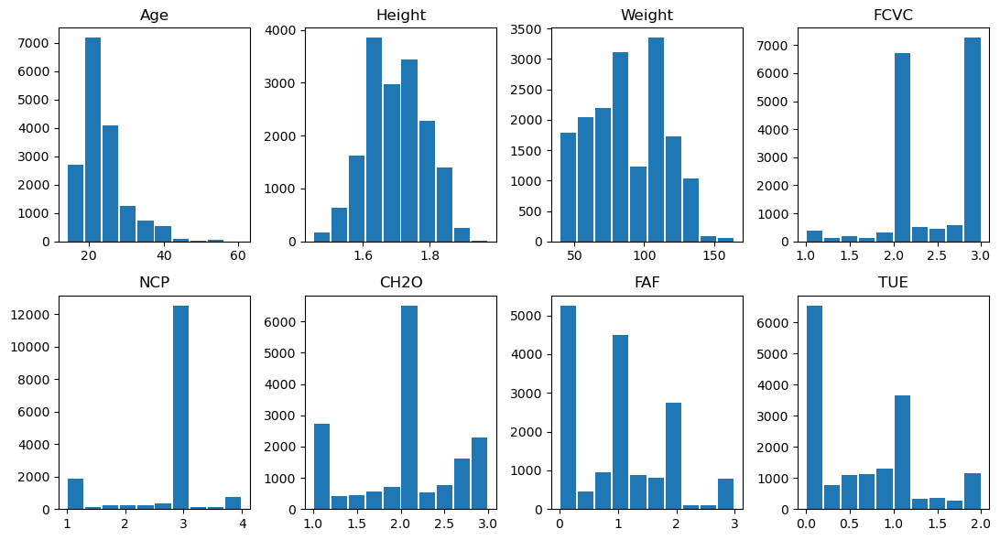

In [9]:
fig, axs = plt.subplots(2, 4, figsize=(11,6))
cpt = 0
for i in range(2):
    for j in range(4):
        var = continuous_variables[cpt]
        axs[i,j].hist(X_train[var].values, rwidth=0.9)
        axs[i,j].set_title(var)
        cpt += 1 
plt.tight_layout()
plt.show()

We can make a few comments:
    
* most individuals are under 30
* heights seem to have a normal distribution centered in 1.7 meters
* weights don't seem to follow a standard distribution, there are almost two groups: one under 80 kg and one above 100
* the others distributions are dominated by integers values, even if there are intermediates values. It seems to be related to the associates survey questions and the processing step applied on indivudals. In summary, most individuals have a high or moderate consumption of vegetables, 3 meals a day, moderate water consumption, a low or slightly moderate frequency of physical activity and a low or moderate amount of time spent using technological devices.

**Categorical variables:**

Here are the catogires we can find in the training set:

In [10]:
for var in categorical_variables:
    print("-", var, ":", ", ".join(X_train[var].unique().tolist()))

- Gender : Female, Male
- family_history_with_overweight : yes, no
- FAVC : yes, no
- CAEC : Sometimes, Frequently, no, Always
- SMOKE : no, yes
- SCC : no, yes
- CALC : Sometimes, no, Frequently
- MTRANS : Public_Transportation, Walking, Automobile, Bike, Motorbike


We can see here that the "Always" category of the "CALC" variable is missing in the training set. We have to keep it in mind later when we will encode the variables.

Binary variables:

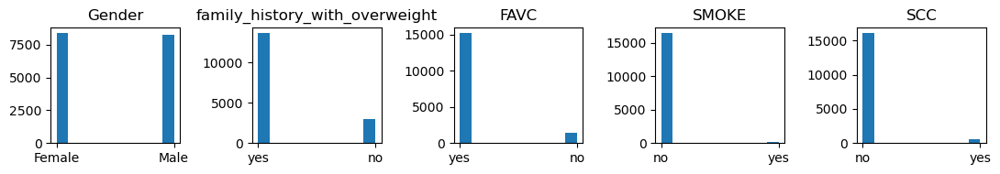

In [11]:
binary_variables = ["Gender", "family_history_with_overweight", "FAVC", "SMOKE", "SCC"]
fig, axs = plt.subplots(1, 5, figsize=(11,2))
for i in range(len(binary_variables)):
    var = binary_variables[i]
    axs[i].hist(X_train[var].values)
    axs[i].set_title(var)
plt.tight_layout()
plt.show()

* Gender: The genders are pretty balanced.
* family_history_with_overweight: Most of individuals have a family history with overweight.
* FAVC: Most of individuals have a frequent consumption of high caloric food.
* SMOKE: Most of individuals don't smoke.
* SCC: Most of individuals don't monitor their calories consumption.

It seems that individuals were well targeted in order to study obesity and CVD risk.

Multiclass variables:

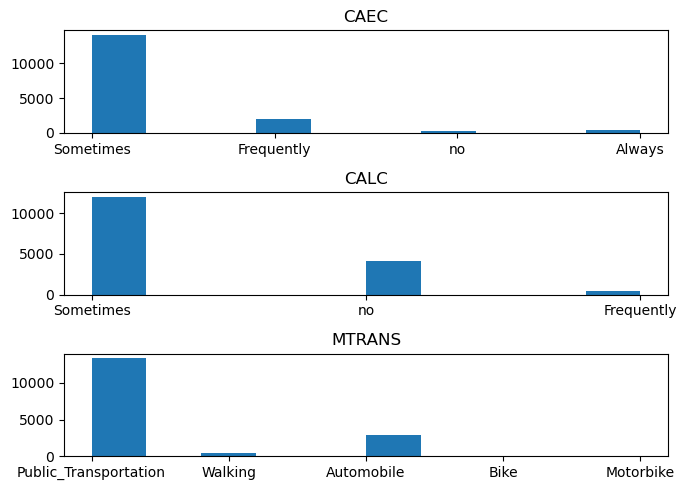

In [12]:
multiclass_variables = ["CAEC", "CALC", "MTRANS"]
fig, axs = plt.subplots(3, 1, figsize=(7,5))
for i in range(len(multiclass_variables)):
    var = multiclass_variables[i]
    axs[i].hist(X_train[var].values)
    axs[i].set_title(var)
plt.tight_layout()
plt.show()

* CAEC: Most of individuals consume sometimes food between meals.
* CALC: Most of individuals consume sometimes alcohol.
* MTRANS: Most of individuals use public transportation.

### 2.2. Correlations bewteen continuous variables

In [13]:
continuous_correlations = X_train[continuous_variables].corr()
fig = px.imshow(
    continuous_correlations.round(2),
    labels=dict(x="Variable", y="Variable", color="Correlation"),
    x=continuous_variables,
    y=continuous_variables,
    color_continuous_scale='RdBu_r', 
    text_auto=True,
    zmin=-1, zmax=1
)
fig.update_xaxes(side="top")
fig.update_layout(width=600, height=500)
fig.show()

They are not highly correlated variables, which is good because it means they provide different types of information.

Let's list the most correlated ones:

* Height and Weigh: which is something obvious but that is not so highly correlated (0.42)
* Weight and CH2O: which means that as people drink more water, their weight tends to be slightly higher, but this relationship is not very strong (0.32)
* Height and FAF: which means that as people are taller, they tend to do more physical activities, but again this relationship is not very strong (0.29)
* Age and TUE: which means that as people are older, they tend to spend less time on technology devices, the relationship is also not very strong (-0.29)

Let's examine the graphs for these variables:

**Height vs Weight**

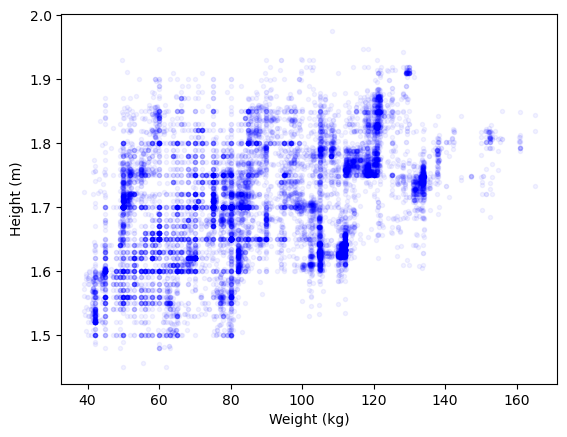

In [14]:
plt.plot(X_train["Weight"], X_train["Height"], 'b.', alpha=0.05)
plt.xlabel("Weight (kg)")
plt.ylabel("Height (m)")
plt.show()

The correlation exists but not so strong.

Indeed, there are almost no short people with a high weight (bottom right of the plot), but we can see that there are a fair number of tall people with a low weight (top left).

Let's plot the normal BMI space on this plot.

This space correspond to BMI between 18.5 and 25:

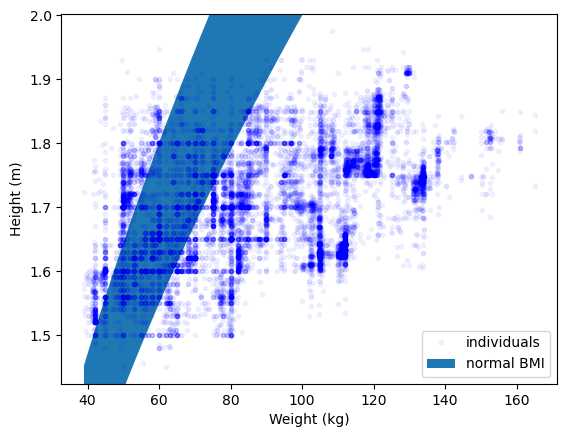

In [15]:
# individuals
plt.plot(X_train["Weight"], X_train["Height"], 'b.', alpha=0.05, label="individuals")
# normal bmi bounds 
weights = np.sort(X_train["Weight"].unique())
normal_bmi_lower = np.sqrt(weights/18.5)
normal_bmi_upper = np.sqrt(weights/25)
plt.fill_between(weights, normal_bmi_lower, normal_bmi_upper, label="normal BMI")
# heights limits
h_min, h_max = X_train["Height"].min(), X_train["Height"].max()
delta_h = h_max-h_min
plt.ylim(h_min-delta_h*0.05, h_max+delta_h*0.05)
# labels and legend
plt.xlabel("Weight (kg)")
plt.ylabel("Height (m)")
plt.legend(loc="lower right")
plt.show()

On the left of this space are the underweighted people, on the right the overweighted ones.

The aim of this dataset is to study obesity so it is a good news to find more overweighted people here.

Let's see now the different BMI categories:

In [16]:
def bmi_bound(weights, threshold):
    return np.sqrt(weights/threshold)

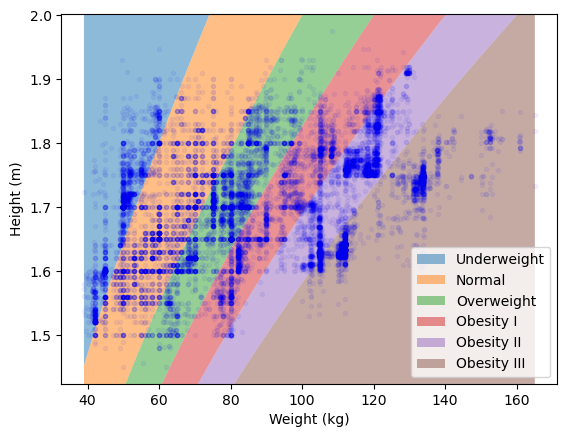

In [17]:
points_opacity = 0.05
spaces_opacity = 0.5
# individuals
plt.plot(X_train["Weight"], X_train["Height"], 'b.', alpha=points_opacity)#, label="individuals")
# bmi bounds 
weights = np.sort(X_train["Weight"].unique())
plt.fill_between(
    weights, bmi_bound(weights, 1), bmi_bound(weights, 18.5), 
    label="Underweight", alpha=spaces_opacity)
plt.fill_between(
    weights, bmi_bound(weights, 18.5), bmi_bound(weights, 25), 
    label="Normal", alpha=spaces_opacity)
plt.fill_between(
    weights, bmi_bound(weights, 25), bmi_bound(weights, 30), 
    label="Overweight", alpha=spaces_opacity)
plt.fill_between(
    weights, bmi_bound(weights, 30), bmi_bound(weights, 35), 
    label="Obesity I", alpha=spaces_opacity)
plt.fill_between(
    weights, bmi_bound(weights, 35), bmi_bound(weights, 40), 
    label="Obesity II", alpha=spaces_opacity)
plt.fill_between(
    weights, bmi_bound(weights, 40), bmi_bound(weights, 100), 
    label="Obesity III", alpha=spaces_opacity)
# heights limits
h_min, h_max = X_train["Height"].min(), X_train["Height"].max()
delta_h = h_max-h_min
plt.ylim(h_min-delta_h*0.05, h_max+delta_h*0.05)
# labels and legend
plt.xlabel("Weight (kg)")
plt.ylabel("Height (m)")
plt.legend(loc="lower right")
plt.show()

The categories appear to be well-balanced.

**Weight vs CH2O** (water consumption)

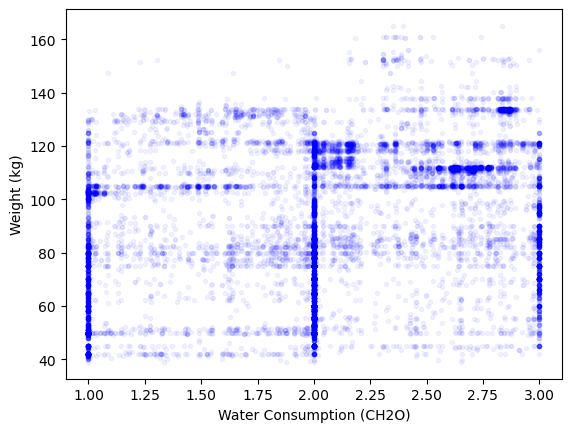

In [18]:
plt.plot(X_train["CH2O"], X_train["Weight"], 'b.', alpha=0.05)
plt.xlabel("Water Consumption (CH2O)")
plt.ylabel("Weight (kg)")
plt.show()

As we saw earlier, the CH2O values are essentially integers: 1, 2 and 3.
    
Let's convert these values into integer values to see how they relate to the Weight variable:

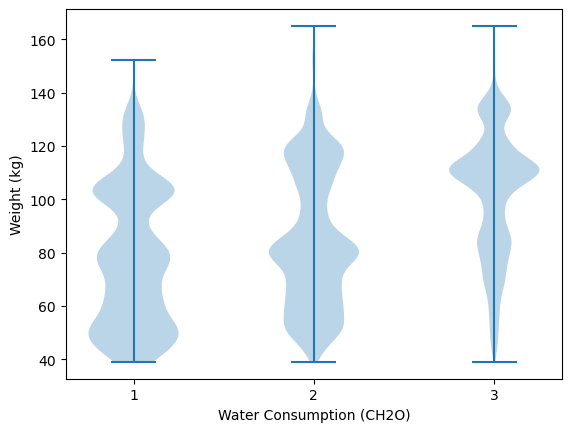

In [19]:
# split the weight values
ch2o_1 = X_train.loc[X_train["CH2O"].round(0) == 1, "Weight"].values
ch2o_2 = X_train.loc[X_train["CH2O"].round(0) == 2, "Weight"].values
ch2o_3 = X_train.loc[X_train["CH2O"].round(0) == 3, "Weight"].values
# format data for violin plot
violin_data = [ch2o_1, ch2o_2, ch2o_3]
# violin plot
plt.violinplot(violin_data, [1, 2, 3], 'b.')
plt.xticks([1, 2, 3])
plt.xlabel("Water Consumption (CH2O)")
plt.ylabel("Weight (kg)")
plt.show()

We can now see that these variables are correlated.

There's not much more to say but that we might convert this variable into a categorical one for the modeling.

**Height vs FAF** (physical activity frequency)

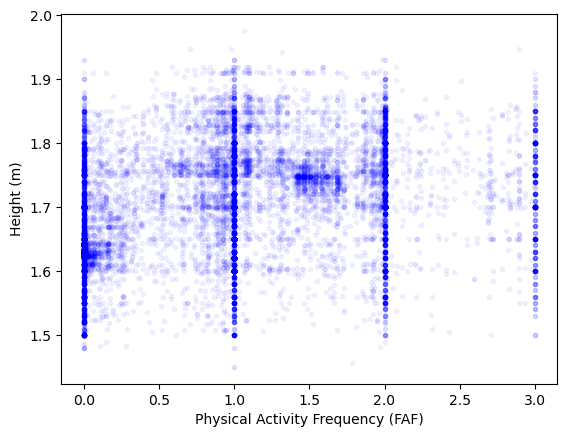

In [20]:
plt.plot(X_train["FAF"], X_train["Height"], 'b.', alpha=0.05)
plt.xlabel("Physical Activity Frequency (FAF)")
plt.ylabel("Height (m)")
plt.show()

The same thing as earlier, most of the values are integers: 0, 1, 2 and 3.

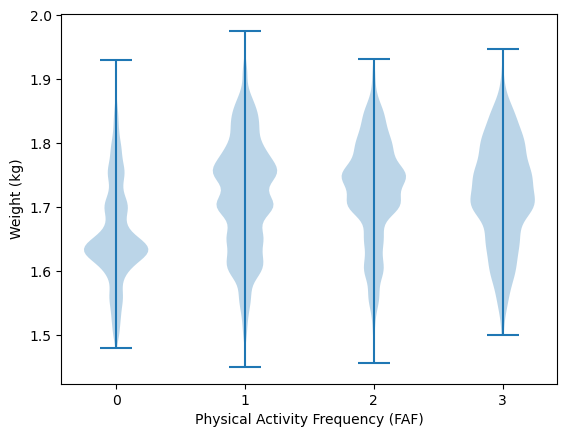

In [21]:
# split the height values
faf_0 = X_train.loc[X_train["FAF"].round(0) == 0, "Height"].values
faf_1 = X_train.loc[X_train["FAF"].round(0) == 1, "Height"].values
faf_2 = X_train.loc[X_train["FAF"].round(0) == 2, "Height"].values
faf_3 = X_train.loc[X_train["FAF"].round(0) == 3, "Height"].values
# format data for violin plot
violin_data = [faf_0, faf_1, faf_2, faf_3]
# violin plot
plt.violinplot(violin_data, [0, 1, 2, 3], 'b.')
plt.xticks([0, 1, 2, 3])
plt.xlabel("Physical Activity Frequency (FAF)")
plt.ylabel("Weight (kg)")
plt.show()

This time it is not that obvious but we can see a difference between no physical activity (0) and more.

**Age vs TUE** (Time using technology devices)

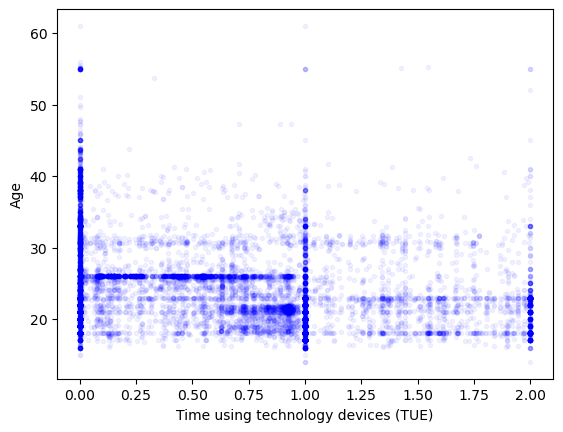

In [22]:
plt.plot(X_train["TUE"], X_train["Age"], 'b.', alpha=0.05)
plt.xlabel("Time using technology devices (TUE)")
plt.ylabel("Age")
plt.show()

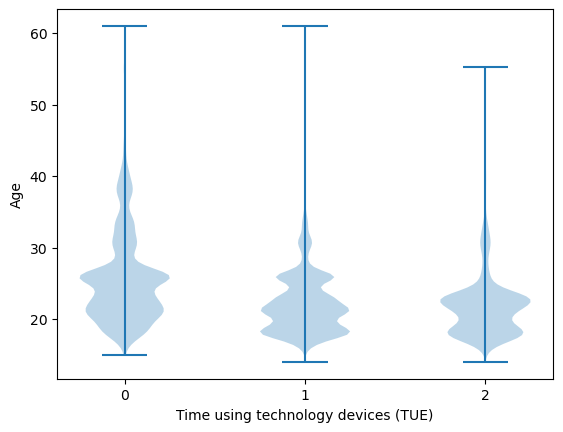

In [23]:
# split the age values
tue_0 = X_train.loc[X_train["TUE"].round(0) == 0, "Age"].values
tue_1 = X_train.loc[X_train["TUE"].round(0) == 1, "Age"].values
tue_2 = X_train.loc[X_train["TUE"].round(0) == 2, "Age"].values
# format data for violin plot
violin_data = [tue_0, tue_1, tue_2]
# violin plot
plt.violinplot(violin_data, [0, 1, 2], 'b.')
plt.xticks([0, 1, 2])
plt.xlabel("Time using technology devices (TUE)")
plt.ylabel("Age")
plt.show()

Here the correlation is both observable and understandable.

### 2.3. Correlations  bewteen categorical variables

Let's see now the correlations between categorical variables.

To do so, we are going to use the Cramér's V measure. 
This is a measure of correlation between categorical variables and gives a value bewteen 0 and +1.

In [24]:
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2_corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    r_corr = r - ((r-1)**2)/(n-1)
    k_corr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))

In [25]:
categorical_data = X_train[categorical_variables]
categorical_corr = pd.DataFrame(index=categorical_variables, columns=categorical_variables)
for col1 in categorical_variables:
    for col2 in categorical_variables:
        categorical_corr.loc[col1, col2] = cramers_v(categorical_data[col1], categorical_data[col2])
categorical_corr = categorical_corr.astype(float)

In [26]:
fig = px.imshow(
    categorical_corr.round(2),
    labels=dict(x="Variable", y="Variable", color="Correlation"),
    x=categorical_variables,
    y=categorical_variables,
    color_continuous_scale='Reds', 
    text_auto=True,
    zmin=0, zmax=1
)
fig.update_xaxes(side="top")
fig.update_layout(width=700, height=600)
fig.show()

They are no highly correlated variables here too.

Let's list the most correlated ones:

* family_history_with_overweight and CAEC: which means that when people have a family hitory with overweight, they tend to have a higher consumption of food between meals, but that is not so highly correlated (0.33)

Let's look at the number of individuals for each categories combination:

In [27]:
fhwo_caec = pd.crosstab(X_train["family_history_with_overweight"], X_train["CAEC"])
fhwo_caec

CAEC,Always,Frequently,Sometimes,no
family_history_with_overweight,,,,
no,114,953,1765,140
yes,286,1016,12254,78


There are a lot more people with family history with overweight, then let's see the percentages:

In [28]:
fhwo_caec/fhwo_caec.sum(axis=1).values[:,None]*100

CAEC,Always,Frequently,Sometimes,no
family_history_with_overweight,,,,
no,3.835801,32.065949,59.387618,4.710633
yes,2.097697,7.451958,89.878246,0.572099


The correlation is not obvious: the CAEC values are more balanced for people with no FHWO than for people with a FHWO who answered at 90% for "Sometimes".
What you could say is:
* the proportion of people who have a strong CAEC: "Always" and "Frequently" is higher for no FWHO
* but the proportion of people who have no CAEC is also higher for no FWHO

### 2.4. Categorical vs Continuous variables

Let's test whether categorical variables have an effect on continuous variables:

In [29]:
# Function to perform ANOVA and return significant pairs
def identify_significant_pairs(df, categorical_variables, continuous_variables, alpha=0.05):
    significant_pairs = []
    for cat_var in categorical_variables:
        for cont_var in continuous_variables:
            grouped_data = df.groupby(cat_var)[cont_var].apply(list)
            f_val, p_val = scipy.stats.f_oneway(*grouped_data)
            if p_val < alpha:
                significant_pairs.append((cat_var, cont_var, p_val))
    return significant_pairs

In [30]:
# Identify significant pairs
significant_pairs = identify_significant_pairs(X_train, categorical_variables, continuous_variables)

# Print significant pairs
for pair in significant_pairs:
    print(f"Significant effect detected between {pair[0]} and {pair[1]} (p-value: {pair[2]})")

Significant effect detected between Gender and Age (p-value: 2.7426999785545085e-17)
Significant effect detected between Gender and Height (p-value: 0.0)
Significant effect detected between Gender and Weight (p-value: 1.9707388573989573e-52)
Significant effect detected between Gender and FCVC (p-value: 0.0)
Significant effect detected between Gender and NCP (p-value: 7.949761645279701e-07)
Significant effect detected between Gender and CH2O (p-value: 1.5780244895360986e-11)
Significant effect detected between Gender and FAF (p-value: 2.8584793368515607e-207)
Significant effect detected between Gender and TUE (p-value: 9.571986637335204e-15)
Significant effect detected between family_history_with_overweight and Age (p-value: 9.227104393064867e-254)
Significant effect detected between family_history_with_overweight and Height (p-value: 2.4317490496315663e-192)
Significant effect detected between family_history_with_overweight and Weight (p-value: 0.0)
Significant effect detected between 

Let's plot all these pairs:

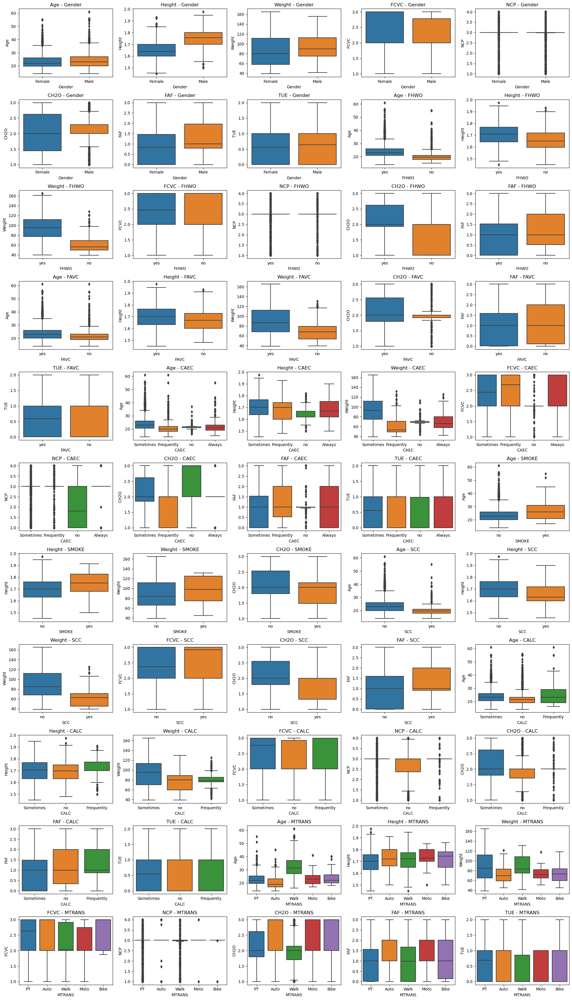

In [31]:
a, b = 11, 5
fig, axes = plt.subplots(a, b, figsize=(20, 35))
fig.suptitle('')

cpt = 0
for i in range(a):
    for j in range(b):
        pair = significant_pairs[cpt]
        sns.boxplot(ax=axes[i,j], x=pair[0], y=pair[1], data=X_train)
        if pair[0] == "family_history_with_overweight":
            axes[i,j].set_xlabel("FHWO")
            axes[i,j].set_title(pair[1]+" - FHWO")
        else:
            axes[i,j].set_title(pair[1]+" - "+pair[0])
            if pair[0] == "MTRANS":
                #plt.setp(axes[i,j].get_xticklabels(), rotation=45)
                axes[i,j].set_xticks([0, 1, 2, 3, 4], ["PT", "Auto", "Walk", "Moto", "Bike"])
        cpt += 1

plt.tight_layout()
plt.show()

We can see that many effects have been detected, so the categorical variables seem to provide information in our dataset.

### 2.5. Target variable

We looked at the independent variables, let's look now at the dependent variable: the obesity level called "NObeyesdad".

Here are the categories:

In [32]:
target_categories = [
    'Insufficient_Weight', 'Normal_Weight', 'Overweight_Level_I', 'Overweight_Level_II', 
    'Obesity_Type_I', 'Obesity_Type_II', 'Obesity_Type_III'
]

In [33]:
y_train_df = pd.DataFrame(y_train, columns=["NObeyesdad"])

Let's begin with the continuous variables and see how they vary depending on these categories.

**Age**

In [34]:
def obesity_level_violin_plot(X, y, var, target_categories, width=15, height=6):
    ticks = np.arange(len(target_categories)).astype(int)
    violin_data = []
    for cat in target_categories:
        violin_data.append(X.loc[y == cat, var].values)
    # violin plot
    plt.figure(figsize=(width,height))
    plt.violinplot(violin_data, ticks, 'b.')
    plt.xticks(ticks, target_categories)
    plt.xlabel("NObeyesdad")
    plt.ylabel(var)
    plt.title(var)
    plt.show()

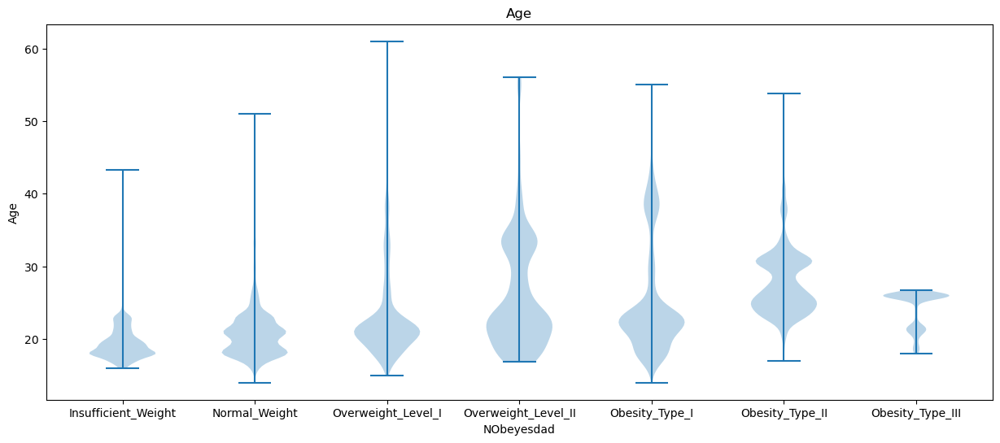

In [35]:
var = "Age"
obesity_level_violin_plot(
    X_train, y_train, var, target_categories, width=15, height=6)

In [36]:
X_train.loc[y_train == "Obesity_Type_III", "Age"].max()

26.699317

People that belong to the categories from "Overweight_Level_II" to "Obesity_Type_III" tend to be slightly older.

The oldest people belong to the "Overweight_Level_I" category.

The oldest individual belonging to the "Obesity_Type_III" category is around 27 years old.

**Height**

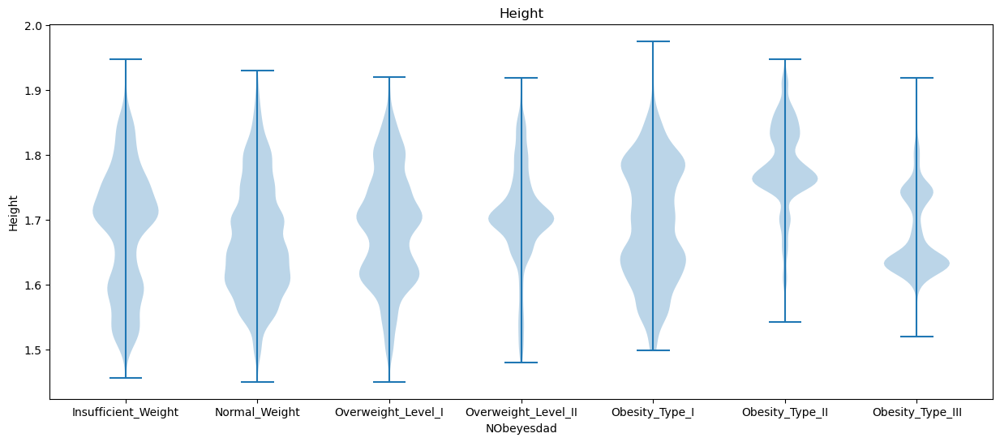

In [37]:
var = "Height"
obesity_level_violin_plot(
    X_train, y_train, var, target_categories, width=15, height=6)

In [38]:
X_train.loc[y_train == "Overweight_Level_II", "Height"].quantile([0.1, 0.9])

0.1    1.621048
0.9    1.800000
Name: Height, dtype: float64

In [39]:
X_train.loc[y_train == "Obesity_Type_II", "Height"].quantile([0.1, 0.9])

0.1    1.701395
0.9    1.863883
Name: Height, dtype: float64

In [40]:
X_train.loc[y_train == "Obesity_Type_III", "Height"].quantile([0.1, 0.9])

0.1    1.621543
0.9    1.752132
Name: Height, dtype: float64

For the most of these categories, heights are pretty well distributed.

The exceptions are:
    
* Overweight_Level_II: a few indviduals below 1.62
* Obesity_Type_II: a few indviduals below 1.7
* Obesity_Type_III: 80% of individuals are between 1.62 and 1.75

**Weight**

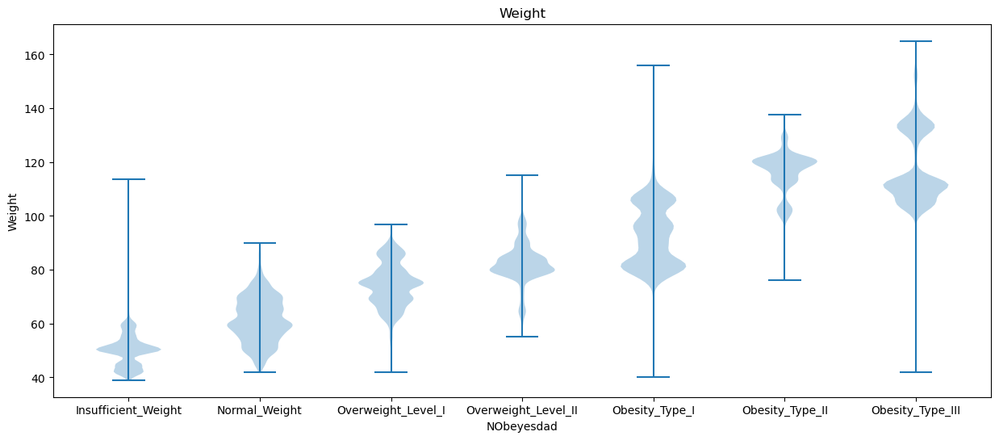

In [41]:
var = "Weight"
obesity_level_violin_plot(
    X_train, y_train, var, target_categories, width=15, height=6)

Here we can clearly see an effect as we could have expected.

Indeed the level of obesity depends obviously on weight.

**FCVC**

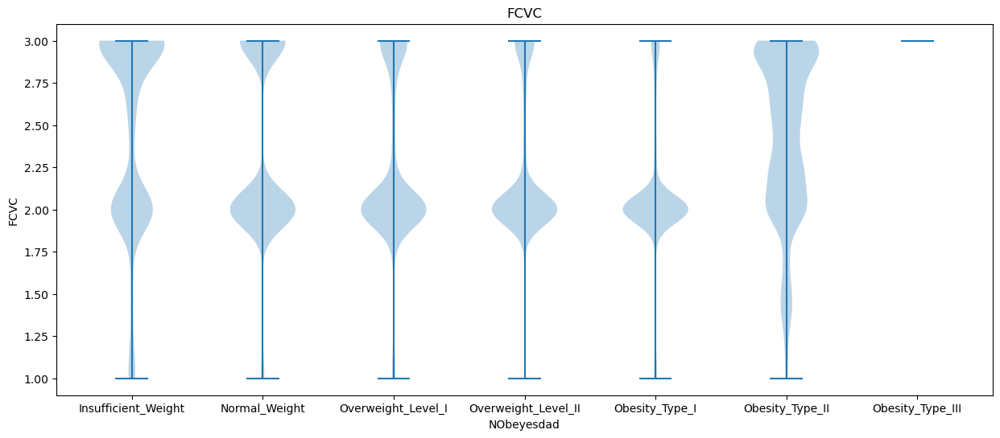

In [42]:
var = "FCVC"
obesity_level_violin_plot(
    X_train, y_train, var, target_categories, width=15, height=6)

Here we can see that as we progress through the overweight categories:
* high consumption of vegetables decrease until the "Obesity_Type_II" where there is a lot of high consumption and all individuals in the "Obesity_Type_III" have a high consumption
* there is almost no low consumption of vegetables in all categories

**NCP**

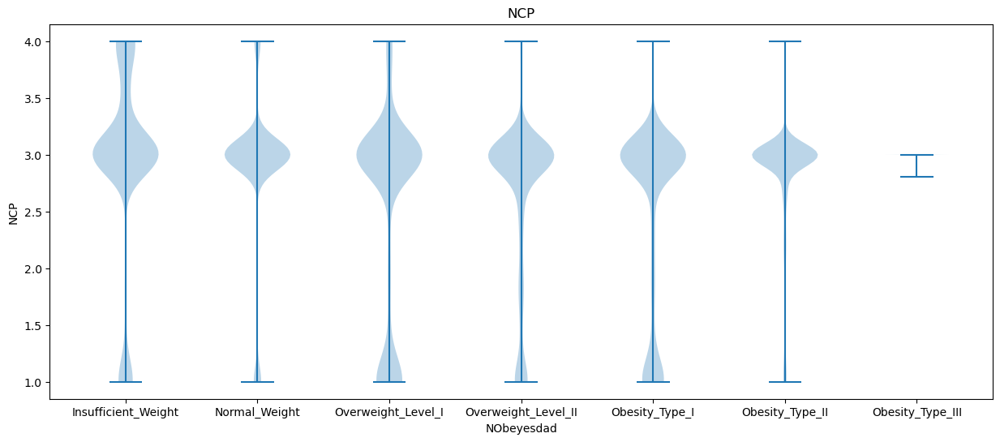

In [43]:
var = "NCP"
obesity_level_violin_plot(
    X_train, y_train, var, target_categories, width=15, height=6)

In [44]:
X_train[X_train["NCP"] == 2].shape[0]/X_train.shape[0]*100

0.05419727809225581

* Almost no one has 4 meals a day but for the "Insufficient_Weight" category.
* Most of individuals have 3.
* Almost no one has 2 (0.05%).
* From "Insufficient_Weight" to "Obesity_Type_I" there are some people having just 1 meal a day.

**CH2O**

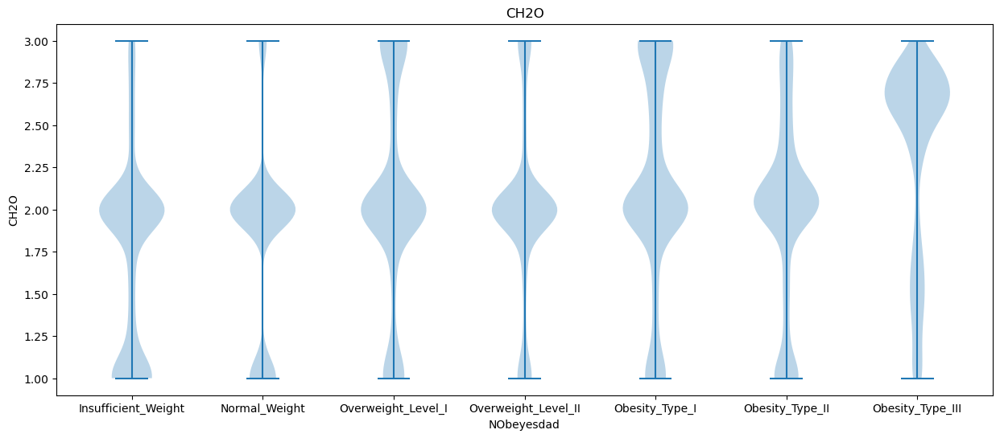

In [45]:
var = "CH2O"
obesity_level_violin_plot(
    X_train, y_train, var, target_categories, width=15, height=6)

* A large majority of individuals have a moderate (2) consumption of water.
* Then, a few have a low consumption (1) and starting from the "Overweight_Level_I" there is a high consumption of water (3).
* The "Obesity_Type_III" is a special case where most of the individuals have a high consumption of water and maybe another group between 2 ans 1.

**FAF**

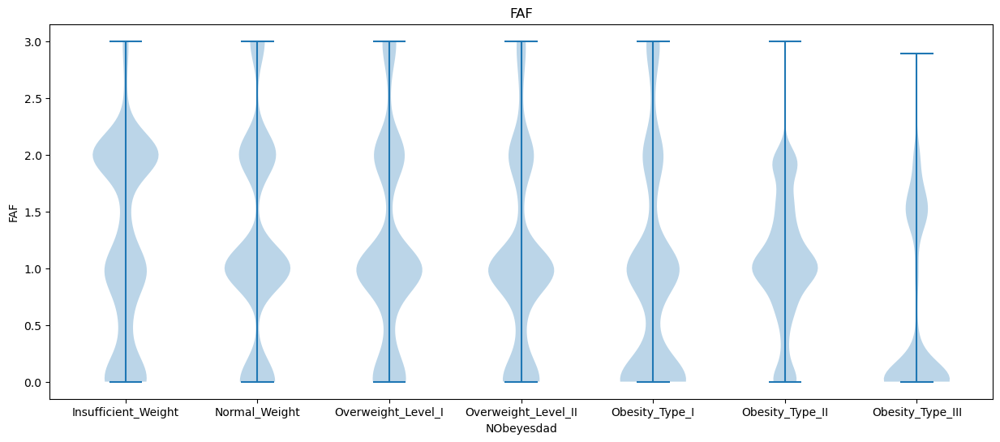

In [46]:
var = "FAF"
obesity_level_violin_plot(
    X_train, y_train, var, target_categories, width=15, height=6)

Here we can clearly and simply see that, as we progress up the overweight categories, the frequency of sporting activity declines.

**TUE**

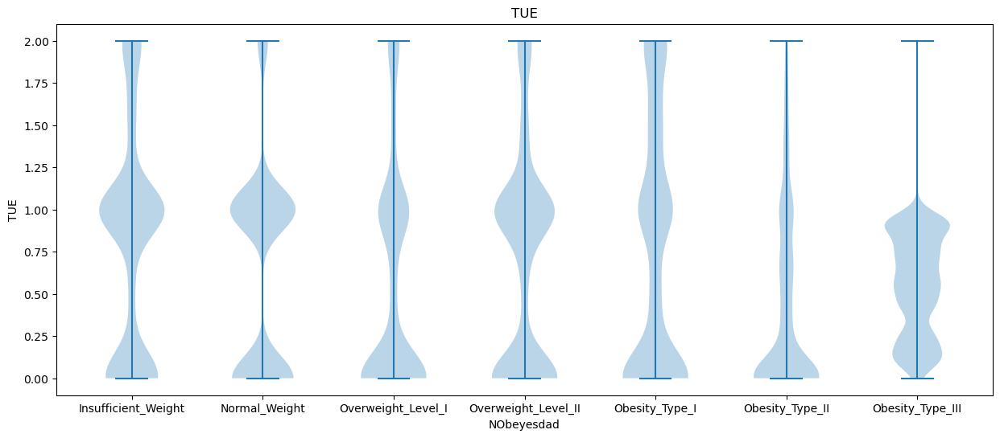

In [47]:
var = "TUE"
obesity_level_violin_plot(
    X_train, y_train, var, target_categories, width=15, height=6)

* The categories spending the most time on technological devices are: "Insufficient_Weight", "Overweight_Level_II" and "Obesity_Type_I".

* Otherwise, they all look the same, with the majority spending little or no time.

* The "Obesity_Type_III" is a special case where most of the individuals have a time spent below 1.

Let's continue with the categorical variables:

**Gender**

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\2268666071.py:7: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\2268666071.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator



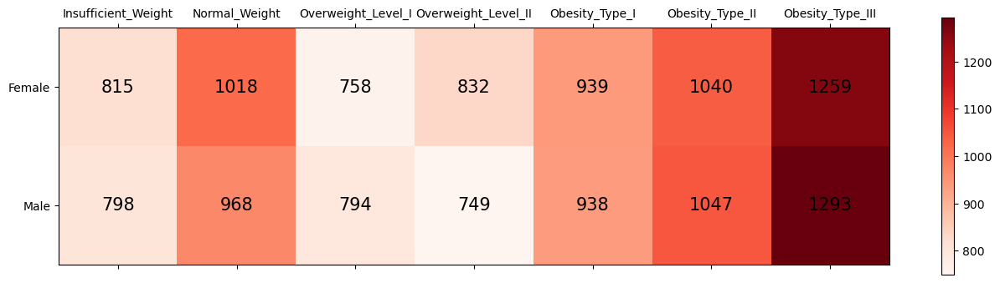

In [48]:
var = "Gender"
var_vs_y = pd.crosstab(X_train[var], y_train_df["NObeyesdad"])[target_categories]

fig, ax = plt.subplots(1, 1, figsize=(16, 4))
cax = ax.matshow(var_vs_y, interpolation='nearest', cmap="Reds")
fig.colorbar(cax)
ax.set_xticklabels(['']+var_vs_y.columns.values.tolist())
ax.set_yticklabels(['']+var_vs_y.index.values.tolist())
for (i, j), z in np.ndenumerate(var_vs_y):
    ax.text(j, i, z, ha='center', va='center', color="Black", size=15)
plt.show()

The gender doesn't seem to determine the obesity level as the number of individuals seems to be the same in each category.

**family_history_with_overweight**

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\2440339643.py:7: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\2440339643.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator



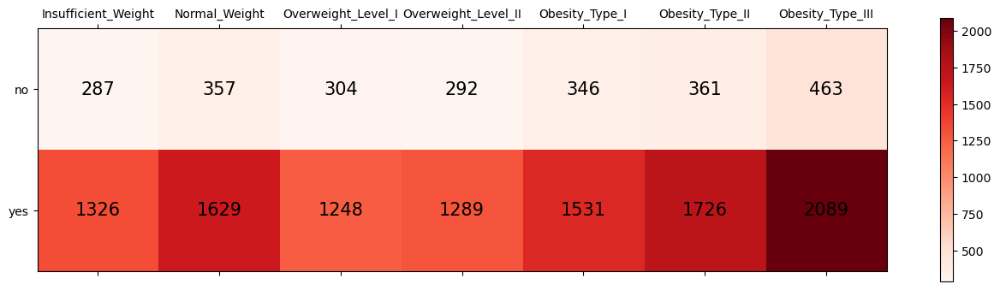

In [49]:
var = "family_history_with_overweight"
var_vs_y = pd.crosstab(X_train[var], y_train_df["NObeyesdad"])[target_categories]

fig, ax = plt.subplots(1, 1, figsize=(16, 4))
cax = ax.matshow(var_vs_y, interpolation='nearest', cmap="Reds")
fig.colorbar(cax)
ax.set_xticklabels(['']+var_vs_y.columns.values.tolist())
ax.set_yticklabels(['']+var_vs_y.index.values.tolist())
for (i, j), z in np.ndenumerate(var_vs_y):
    ax.text(j, i, z, ha='center', va='center', color="Black", size=15)
plt.show()

This variable doesn't seem to be correlated and to help at determining the obesity level category.

**FAVC**

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\1202302346.py:7: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\1202302346.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator



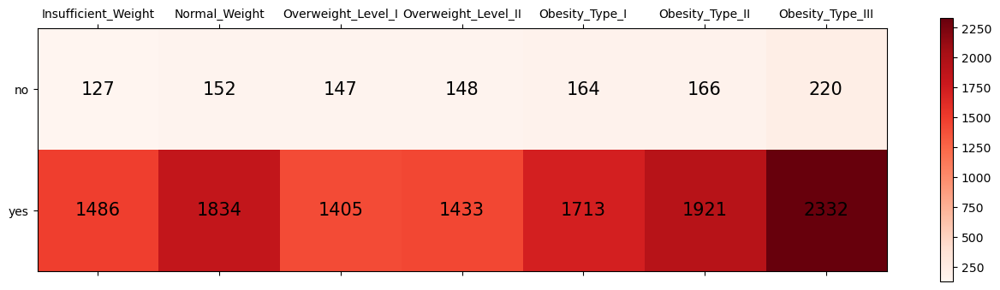

In [50]:
var = "FAVC"
var_vs_y = pd.crosstab(X_train[var], y_train_df["NObeyesdad"])[target_categories]

fig, ax = plt.subplots(1, 1, figsize=(16, 4))
cax = ax.matshow(var_vs_y, interpolation='nearest', cmap="Reds")
fig.colorbar(cax)
ax.set_xticklabels(['']+var_vs_y.columns.values.tolist())
ax.set_yticklabels(['']+var_vs_y.index.values.tolist())
for (i, j), z in np.ndenumerate(var_vs_y):
    ax.text(j, i, z, ha='center', va='center', color="Black", size=15)
plt.show()

Here too, this variable doesn't seem to help.

**CAEC**

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\2517106661.py:7: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\2517106661.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator



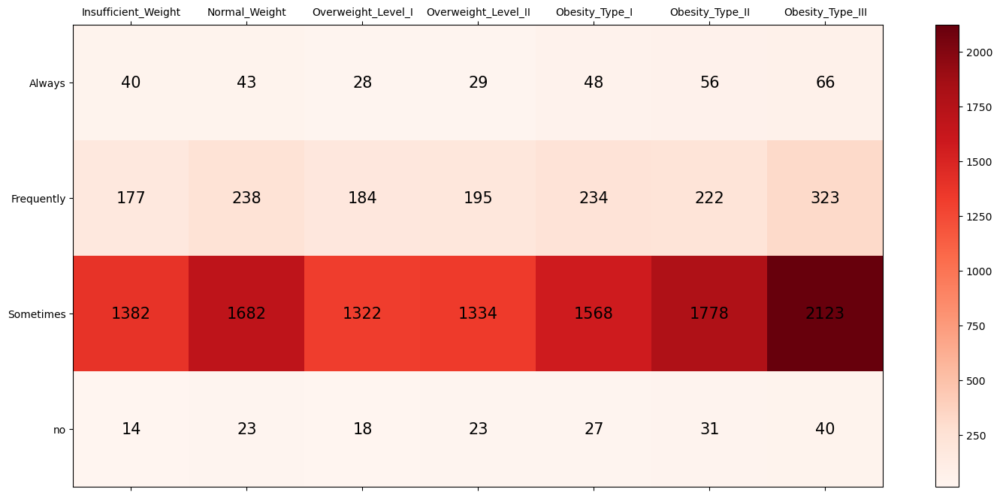

In [51]:
var = "CAEC"
var_vs_y = pd.crosstab(X_train[var], y_train_df["NObeyesdad"])[target_categories]

fig, ax = plt.subplots(1, 1, figsize=(18, 8))
cax = ax.matshow(var_vs_y, interpolation='nearest', cmap="Reds")
fig.colorbar(cax)
ax.set_xticklabels(['']+var_vs_y.columns.values.tolist())
ax.set_yticklabels(['']+var_vs_y.index.values.tolist())
for (i, j), z in np.ndenumerate(var_vs_y):
    ax.text(j, i, z, ha='center', va='center', color="Black", size=15)
plt.show()

Most of people answer "Sometimes" to this question.

**SMOKE**

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\479741233.py:7: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\479741233.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator



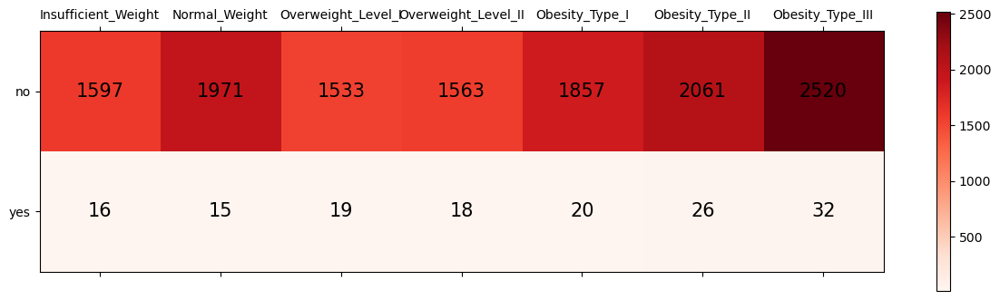

In [52]:
var = "SMOKE"
var_vs_y = pd.crosstab(X_train[var], y_train_df["NObeyesdad"])[target_categories]

fig, ax = plt.subplots(1, 1, figsize=(15, 4))
cax = ax.matshow(var_vs_y, interpolation='nearest', cmap="Reds")
fig.colorbar(cax)
ax.set_xticklabels(['']+var_vs_y.columns.values.tolist())
ax.set_yticklabels(['']+var_vs_y.index.values.tolist())
for (i, j), z in np.ndenumerate(var_vs_y):
    ax.text(j, i, z, ha='center', va='center', color="Black", size=15)
plt.show()

Most of people don't smoke.

**SCC**

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\2067127925.py:7: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\2067127925.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator



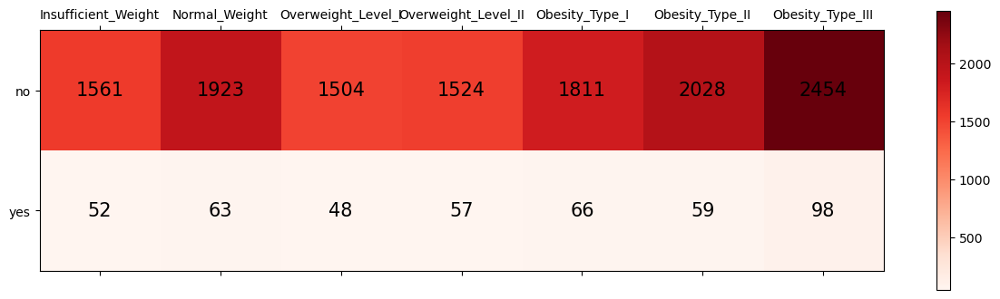

In [53]:
var = "SCC"
var_vs_y = pd.crosstab(X_train[var], y_train_df["NObeyesdad"])[target_categories]

fig, ax = plt.subplots(1, 1, figsize=(15, 4))
cax = ax.matshow(var_vs_y, interpolation='nearest', cmap="Reds")
fig.colorbar(cax)
ax.set_xticklabels(['']+var_vs_y.columns.values.tolist())
ax.set_yticklabels(['']+var_vs_y.index.values.tolist())
for (i, j), z in np.ndenumerate(var_vs_y):
    ax.text(j, i, z, ha='center', va='center', color="Black", size=15)
plt.show()

Most of people don't monitor their calories consumption.

**CALC**

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\2313728218.py:7: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\2313728218.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator



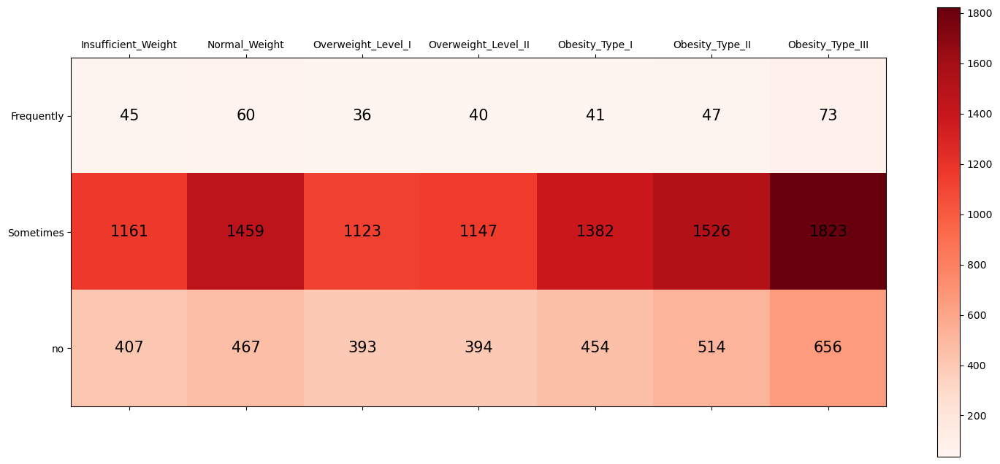

In [54]:
var = "CALC"
var_vs_y = pd.crosstab(X_train[var], y_train_df["NObeyesdad"])[target_categories]

fig, ax = plt.subplots(1, 1, figsize=(18, 8))
cax = ax.matshow(var_vs_y, interpolation='nearest', cmap="Reds")
fig.colorbar(cax)
ax.set_xticklabels(['']+var_vs_y.columns.values.tolist())
ax.set_yticklabels(['']+var_vs_y.index.values.tolist())
for (i, j), z in np.ndenumerate(var_vs_y):
    ax.text(j, i, z, ha='center', va='center', color="Black", size=15)
plt.show()

Most of people consume somtimes alcohol or they don't.

**MTRANS**

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\3105403161.py:7: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\vanna\AppData\Local\Temp\ipykernel_632\3105403161.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator



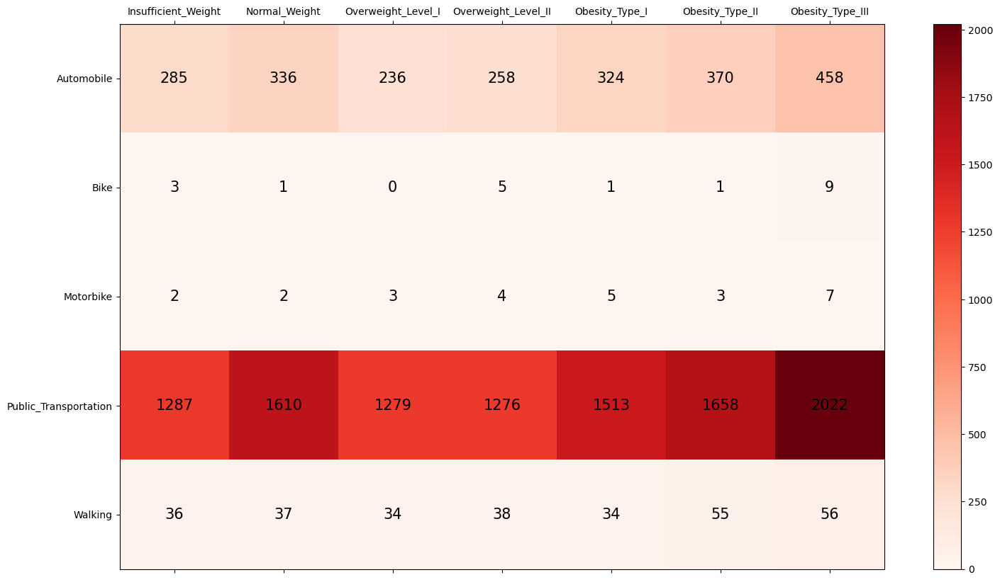

In [55]:
var = "MTRANS"
var_vs_y = pd.crosstab(X_train[var], y_train_df["NObeyesdad"])[target_categories]

fig, ax = plt.subplots(1, 1, figsize=(18, 10))
cax = ax.matshow(var_vs_y, interpolation='nearest', cmap="Reds")
fig.colorbar(cax)
ax.set_xticklabels(['']+var_vs_y.columns.values.tolist())
ax.set_yticklabels(['']+var_vs_y.index.values.tolist())
for (i, j), z in np.ndenumerate(var_vs_y):
    ax.text(j, i, z, ha='center', va='center', color="Black", size=15)
plt.show()

As a conclusion we could say that there is no obvious variable that determine exactly the level obesity of an individual. The best one is the weight but we want to try to do better.

All the variables seem more or less informative, but we could introduce variable transformations and calculate new ones.

## 3. Feature Engineering

Now that we have seen how the variables are distributed and how they interact with each other, we can think about transforming, adding, deleting and then encoding some of them. 

In [56]:
X_train_new_features = X_train.copy()

### 3.1. Obesity level indicators

The first idea that came in my mind was to compute the BMI. 
It depends only on height and weight, let's compute it for the dataset:

In [57]:
def bmi_score(data):
    return data["Weight"]/data["Height"]**2

In [58]:
X_train_new_features["BMI"] = bmi_score(X_train_new_features)

Here's its distribution:

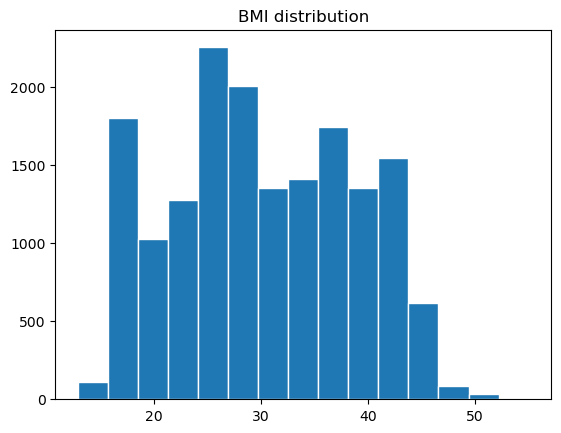

In [59]:
plt.hist(X_train_new_features["BMI"], bins=15, edgecolor="white")
plt.title("BMI distribution")
plt.show()

And how these values are distributed depending on the level obesity categories: 

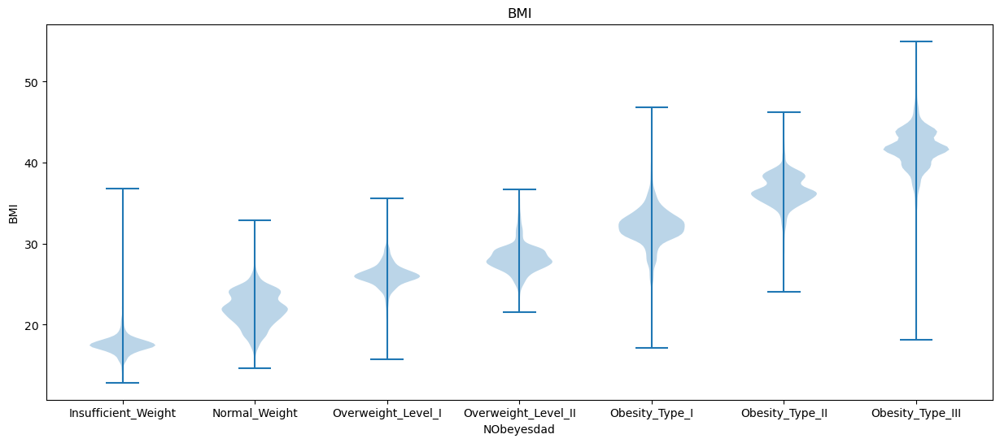

In [60]:
var = "BMI"
obesity_level_violin_plot(
    X_train_new_features, y_train, var, target_categories, width=15, height=6)

The BMI seems promising! The catgories are pretty well separated.

It could be interesting to see what happen with similar measures.
I looked on wikipedia and found several variants:
* Corpulence Index (CI), a measure of corpulence comptued such as: $\text{CI} = \text{Weight }/\text{ Height}^3$.
* New BMI (NBMI), a variant of BMI using a 2.5 exponent: $\text{BMI}_{\text{new}} = 1.3 \text{ Weight }/\text{ Height}^{2.5}$
* BMI prime (BMIP), a modification of the standard BMI: $\text{BMI prime } = \text{BMI }/ \, 25$

Let's compute and observe them:

**Corpulence Index (CI)**

In [61]:
def ci_score(data):
    return data["Weight"]/data["Height"]**3

In [62]:
X_train_new_features["CI"] = ci_score(X_train_new_features)

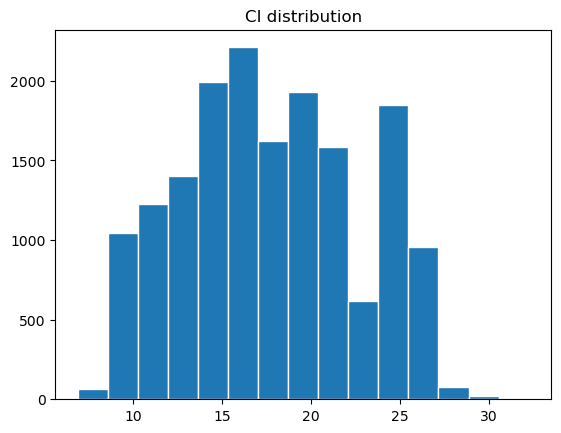

In [63]:
plt.hist(X_train_new_features["CI"], bins=15, edgecolor="white")
plt.title("CI distribution")
plt.show()

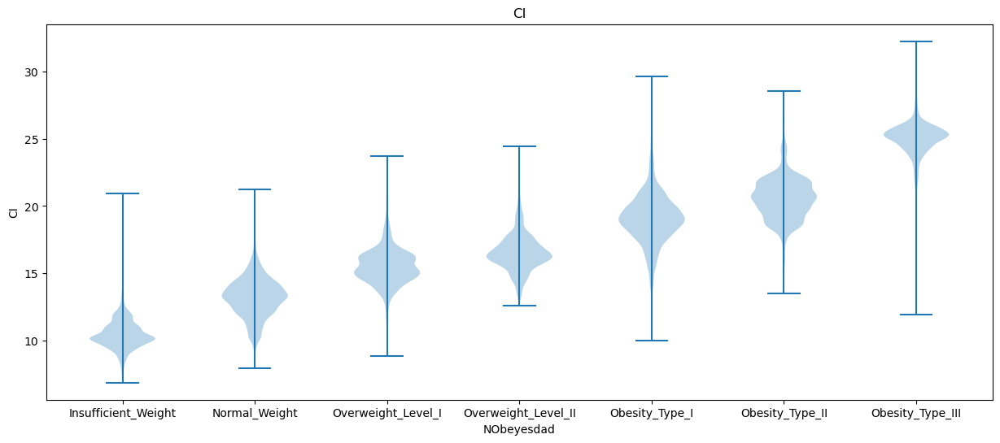

In [64]:
var = "CI"
obesity_level_violin_plot(
    X_train_new_features, y_train, var, target_categories, width=15, height=6)

The categories are also well separated, but some overlap more than with standard BMI and others, notably between "Obesity_Type_II" and "Obesity_Type_III", separate better.

**New BMI (NBMI)**

In [65]:
def nbmi_score(data):
    return 1.3*data["Weight"]/data["Height"]**2.5

In [66]:
X_train_new_features["NBMI"] = nbmi_score(X_train_new_features)

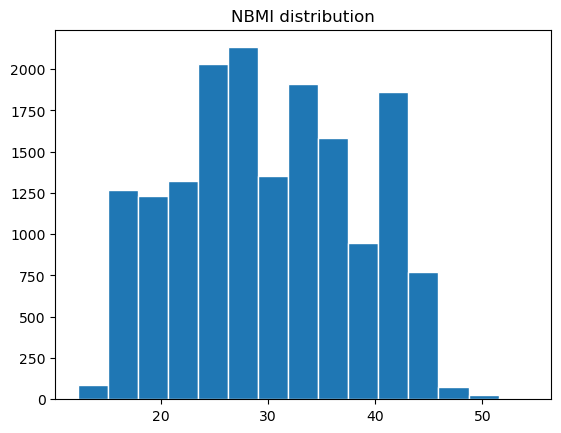

In [67]:
plt.hist(X_train_new_features["NBMI"], bins=15, edgecolor="white")
plt.title("NBMI distribution")
plt.show()

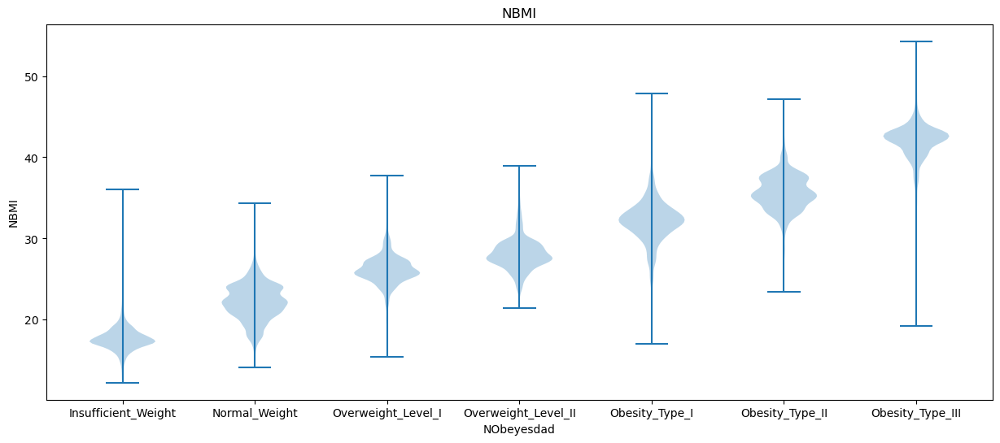

In [68]:
var = "NBMI"
obesity_level_violin_plot(
    X_train_new_features, y_train, var, target_categories, width=15, height=6)

**BMI prime (BMIP)**

In [69]:
def bmip_score(data, optimal_bmi=25):
    return bmi_score(data)/optimal_bmi

In [70]:
X_train_new_features["BMIP"] = bmip_score(X_train_new_features, optimal_bmi=25)

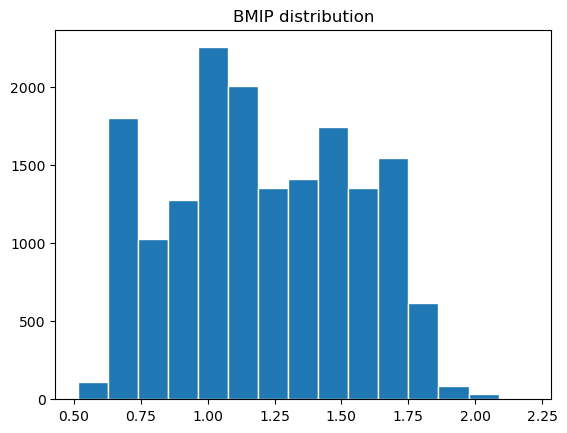

In [71]:
plt.hist(X_train_new_features["BMIP"], bins=15, edgecolor="white")
plt.title("BMIP distribution")
plt.show()

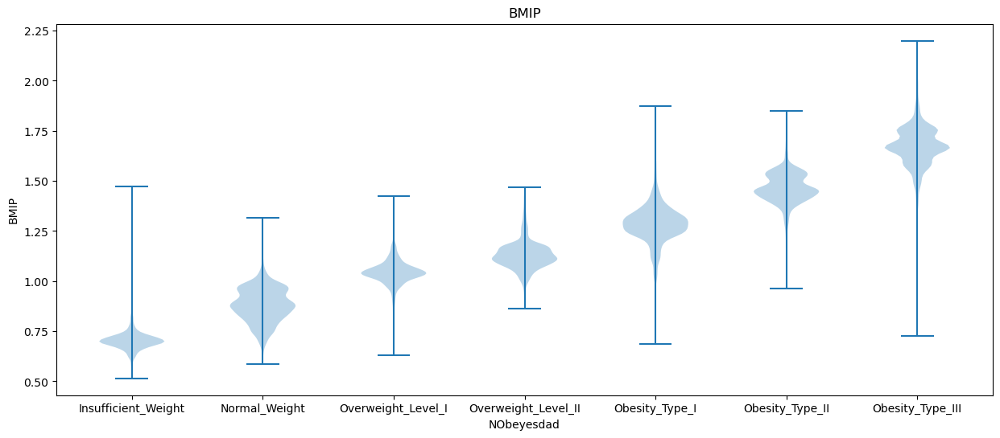

In [72]:
var = "BMIP"
obesity_level_violin_plot(
    X_train_new_features, y_train, var, target_categories, width=15, height=6)

Let's test the significance of effect from these variables:

In [73]:
bmi_variables = ["BMI", "CI", "NBMI", "BMIP"]

# Get new variables and y in a dataframe
X_tmp = X_train_new_features.copy()[bmi_variables]
X_tmp = pd.concat([X_tmp.reset_index(drop=True), y_train_df.reset_index(drop=True)], axis=1)

# Identify significant pairs
significant_pairs = identify_significant_pairs(X_tmp, ["NObeyesdad"], bmi_variables)

# Print significant pairs
for pair in significant_pairs:
    print(f"Significant effect detected between {pair[0]} and {pair[1]} (p-value: {pair[2]})")

Significant effect detected between NObeyesdad and BMI (p-value: 0.0)
Significant effect detected between NObeyesdad and CI (p-value: 0.0)
Significant effect detected between NObeyesdad and NBMI (p-value: 0.0)
Significant effect detected between NObeyesdad and BMIP (p-value: 0.0)


They all have a significant effect on the target variable.

Let's finish by looking at the correlations between these measures:

In [74]:
bmi_features_correlations = X_tmp[bmi_variables].corr()
fig = px.imshow(
    bmi_features_correlations.round(2),
    labels=dict(x="Variable", y="Variable", color="Correlation"),
    x=bmi_variables,
    y=bmi_variables,
    color_continuous_scale='RdBu_r', 
    text_auto=True,
    zmin=-1, zmax=1
)
fig.update_xaxes(side="top")
fig.update_layout(width=600, height=500)
fig.show()

As we would have expected, they're highly correlated from each others.

We will keep the standard BMI as all these variables are really similar. 

### 3.2. Scores based on categorical variables

We can try to compute a score for eating habits and physical conditions.

**Eating Habits**

This groups together variables FAVC, FCVC, NCP, CAEC, CH2O and CALC.
There are both categorical and continuous variables but as we have seen the continuous come originally from categorical answers.
So let's convert FCVC, NCP and CH2O into categorical variables.

* FCVC: 1 (Never), 2 (Sometimes) and 3 (Always)
* NCP: 1 (1), 2 (2), 3 (3) and 4 (>3)
* CH2O: 1 (Less than a liter), 2 (Between 1 and 2 L), and 3 (More than 2 L)

We are going to round the values in order to convert them easily:

In [75]:
for var in ["FCVC", "NCP", "CH2O"]:
    X_train_new_features[var] = X_train_new_features[var].round().astype(int)

Now, let's convert them according to their definitions:

In [76]:
int_variables_into_categories = {
    "FCVC": {1:"Never", 2:"Sometimes", 3:"Always"},
    "NCP": {1:"1", 2:"2", 3:"3", 4:">3"},
    "CH2O": {1:"<1L", 2:"1-2L", 3:">2L"}
}
int_variables_into_integers = {
    "FCVC": {"Never":1, "Sometimes":2, "Always":3},
    "NCP": {"1":1, "2":2, "3":3, ">3":4},
    "CH2O": {"<1L":1, "1-2L":2, ">2L":3}
}

In [77]:
for var in ["FCVC", "NCP", "CH2O"]:
    X_train_new_features[var] = X_train_new_features[var].apply(lambda x: int_variables_into_categories[var][x])

Finally, let's encode them with an ordinal encoder. 
This way we can provide labels in the order we want, for example from bad to good eating habits.

In [78]:
eh_variables = ['FAVC', 'FCVC', 'NCP', 'CAEC', 'CH2O', 'CALC']
eh_variables_categories = {
    "FAVC" : ["yes", "no"],
    "FCVC" : ["Never", "Sometimes", "Always"],
    "NCP" : [">3", "3", "2", "1"],
    "CAEC" : ["Always", "Frequently", "Sometimes", "no"], 
    "CH2O" : ["<1L", "1-2L", ">2L"],
    "CALC" : ["Always", "Frequently", "Sometimes", "no"]
}

In [79]:
eh_codes_list = [eh_variables_categories[var] for var in eh_variables]
eh_oe = OrdinalEncoder(categories=eh_codes_list)
X_train_new_features[eh_variables] = eh_oe.fit_transform(X_train_new_features[eh_variables])

I suppose the ideal answers should be:
* FAVC = "no" (1)
* FCVC = "Always" (2)
* NCP = "3" (1)
* CAEC = "no" (3)
* CH2O = ">2L" (2)
* CALC = "no" (3)

In [80]:
variables_ideal_values = {
    "FAVC": 1,
    "FCVC": 2,
    "NCP": 1,
    "CAEC": 3,
    "CH2O": 2,
    "CALC": 3
}

Then we can compute a score for each encoded variables:

In [81]:
def eh_var_score(variable_values, ideal_value):
    scores = np.abs(ideal_value - variable_values)
    scores /= np.max(scores)
    return 1-scores

In [82]:
for var in eh_variables:
    X_train_new_features[var] = eh_var_score(X_train_new_features[var], variables_ideal_values[var])

In [83]:
X_train_new_features["EH_score"] = X_train_new_features[eh_variables].mean(axis=1)

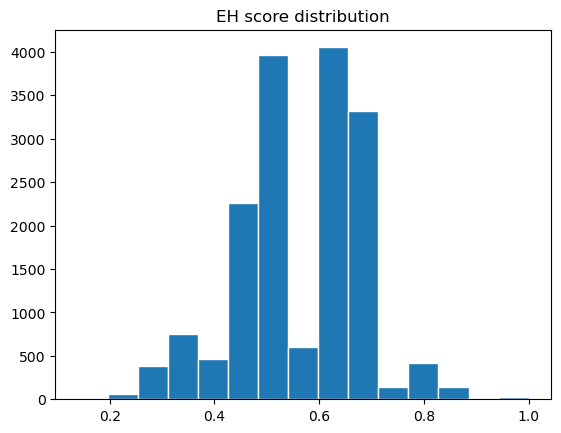

In [84]:
plt.hist(X_train_new_features["EH_score"], bins=15, edgecolor="white")
plt.title("EH score distribution")
plt.show()

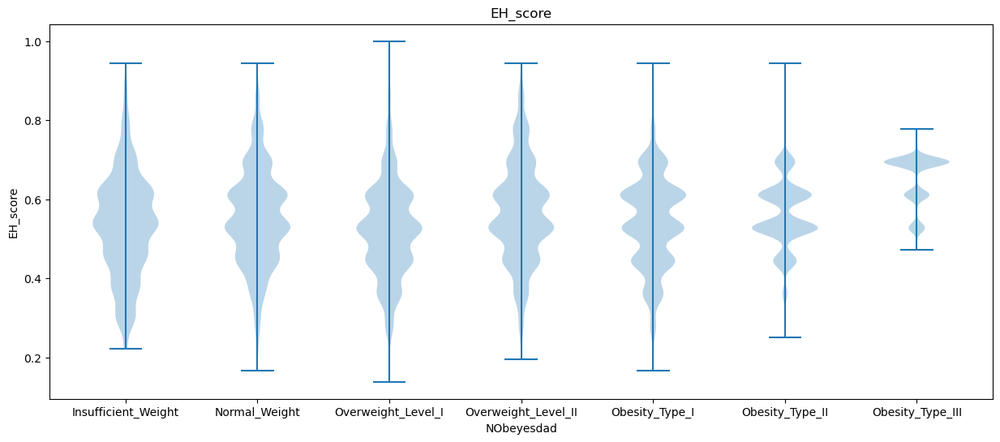

In [85]:
var = "EH_score"
obesity_level_violin_plot(
    X_train_new_features, y_train, var, target_categories, width=15, height=6)

It doesn't seem to be really promising.

Let's try with physical conditon:

**Physical condition**

This groups together variables SCC, FAF, TUE and MTRANS.
There are both categorical and continuous variables but as we have seen the continuous come originally from categorical answers.
So let's convert FAF and TUE into categorical variables.

* FAF: 0 (I do not have), 1 (1 or 2 days), 2 (2 or 4 days) and 3 (4 or 5 days)
* TUE: 0 (0–2 hours), 1 (3–5 hours) and 2 (More than 5 hours)

We are going to round the values in order to convert them easily:

In [86]:
for var in ["FAF", "TUE"]:
    X_train_new_features[var] = X_train_new_features[var].round().astype(int)

Now, let's convert them according to their definitions:

In [87]:
int_variables_into_categories["FAF"] = {0:"no", 1:"1_2d", 2:"2_4d", 3:"4_5d"}
int_variables_into_categories["TUE"] = {0:"0_2h", 1:"3_5h", 2:"+5h"}

int_variables_into_integers["FAF"] = {"no":0 , "1_2d":1 , "2_4d":2 , "4_5d":3}
int_variables_into_integers["TUE"] = {"0_2h":0 , "3_5h": 1, "+5h": 2}

In [88]:
for var in ["FAF", "TUE"]:
    X_train_new_features[var] = X_train_new_features[var].apply(lambda x: int_variables_into_categories[var][x])

Finally, let's encode them with an ordinal encoder. This way we can provide labels in the order we want, for example from bad to good physical conditions.

In [89]:
pc_variables = ['SCC', 'FAF', 'TUE', 'MTRANS']
pc_variables_categories = {
    "SCC" : ["no", "yes"],
    "FAF" : ["no", "1_2d", "2_4d", "4_5d"],
    "TUE" : ["+5h", "3_5h", "0_2h"],
    "MTRANS" : ['Automobile', 'Public_Transportation', 'Motorbike', 'Walking', 'Bike']
}

In [90]:
pc_codes_list = [pc_variables_categories[var] for var in pc_variables]
pc_oe = OrdinalEncoder(categories=pc_codes_list)
X_train_new_features[pc_variables] = pc_oe.fit_transform(X_train_new_features[pc_variables])

I suppose the ideal answers should be:
* SCC = "yes" (1)
* FAF = "4-5d" (3)
* TUE = "0–2h" (2)
* MTRANS = "Bike" (4)

In [91]:
variables_ideal_values["SCC"] = 1
variables_ideal_values["FAF"] = 3
variables_ideal_values["TUE"] = 2
variables_ideal_values["MTRANS"] = 4

Then we can compute a score for each encoded variables:

In [92]:
def pc_var_score(variable_values, ideal_value):
    scores = np.abs(ideal_value - variable_values)
    scores /= np.max(scores)
    return 1-scores

In [93]:
for var in pc_variables:
    X_train_new_features[var] = pc_var_score(X_train_new_features[var], variables_ideal_values[var])

In [94]:
X_train_new_features["PC_score"] = X_train_new_features[pc_variables].mean(axis=1)

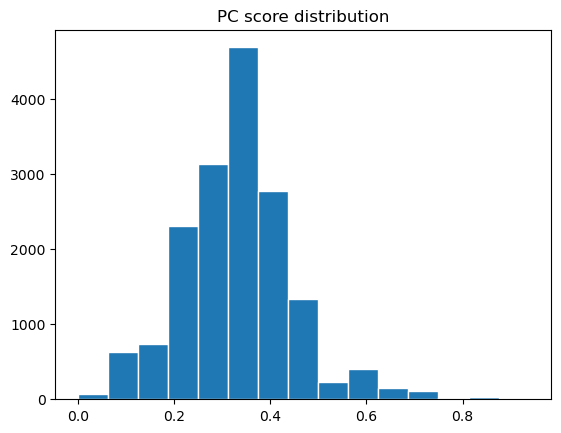

In [95]:
plt.hist(X_train_new_features["PC_score"], bins=15, edgecolor="white")
plt.title("PC score distribution")
plt.show()

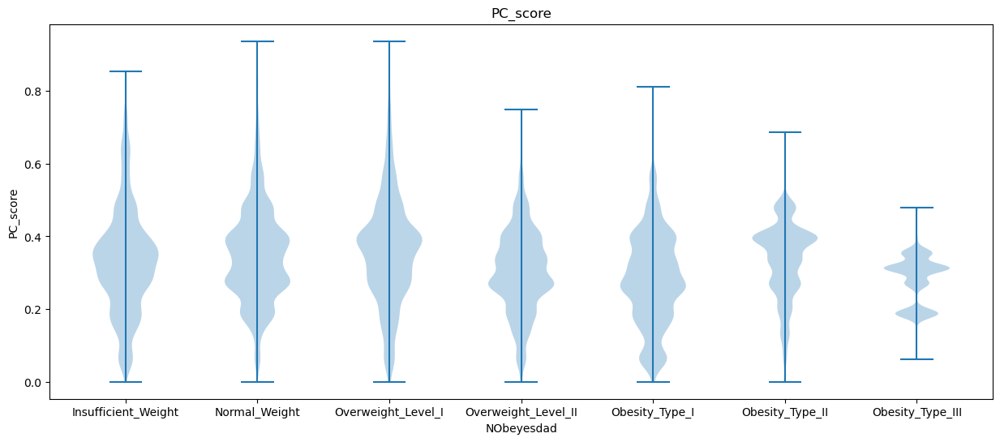

In [96]:
var = "PC_score"
obesity_level_violin_plot(
    X_train_new_features, y_train, var, target_categories, width=15, height=6)

Here again, this doesn't seem to be promising.

Let's try some other approaches.

### 3.3. Others approaches

#### 3.3.1. Polynomial features

Polynomial features consist in setting a variable to a certain power (usually 2 or 3).

In [97]:
X_train_poly_features = X_train.copy()

**Age**

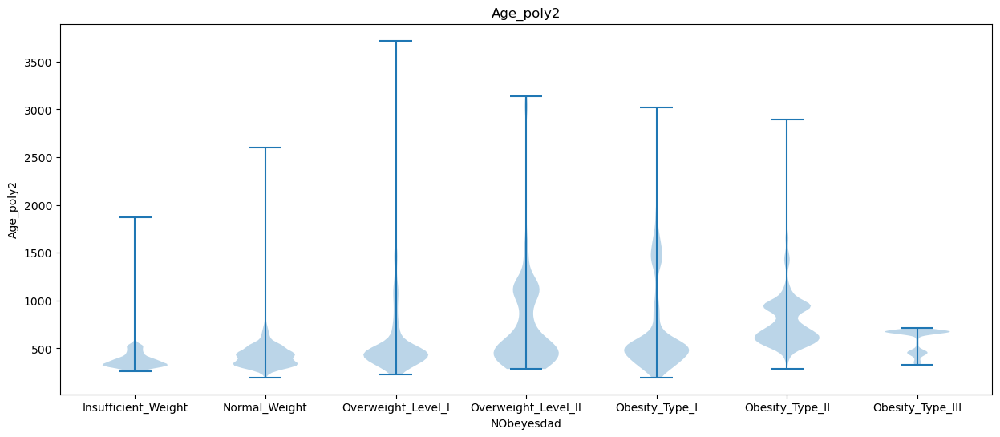

In [98]:
var = "Age"
X_train_poly_features[var+"_poly2"] = X_train_poly_features[var]**2
obesity_level_violin_plot(
    X_train_poly_features, y_train, 
    var+"_poly2", target_categories, 
    width=15, height=6)

**Height**

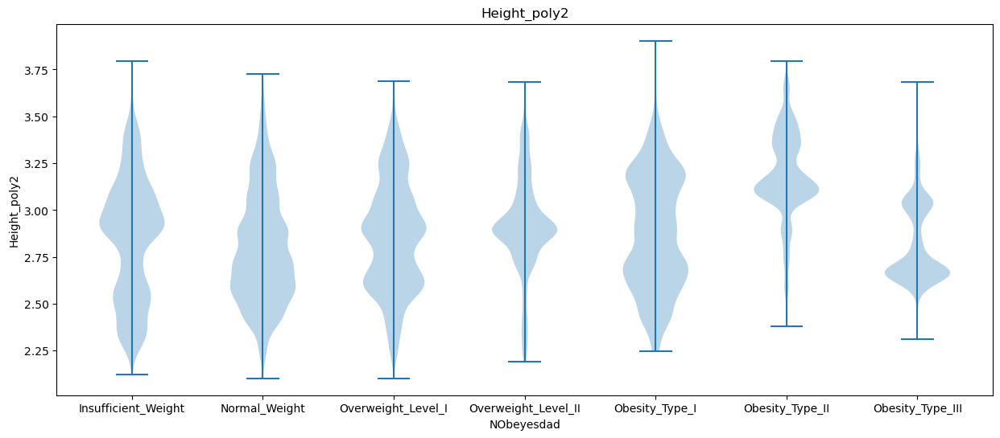

In [99]:
var = "Height"
X_train_poly_features[var+"_poly2"] = X_train_poly_features[var]**2
obesity_level_violin_plot(
    X_train_poly_features, y_train, 
    var+"_poly2", target_categories, 
    width=15, height=6)

**Weight**

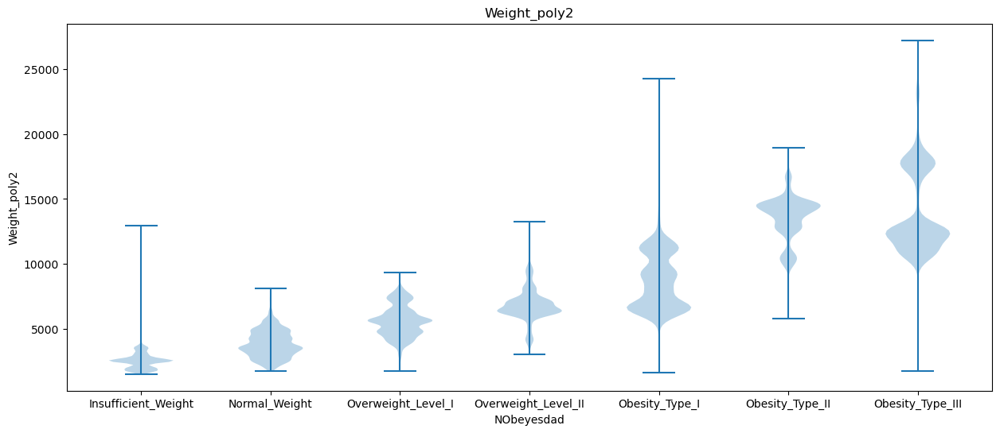

In [100]:
var = "Weight"
X_train_poly_features[var+"_poly2"] = X_train_poly_features[var]**2
obesity_level_violin_plot(
    X_train_poly_features, y_train, 
    var+"_poly2", target_categories, 
    width=15, height=6)

**FCVC**

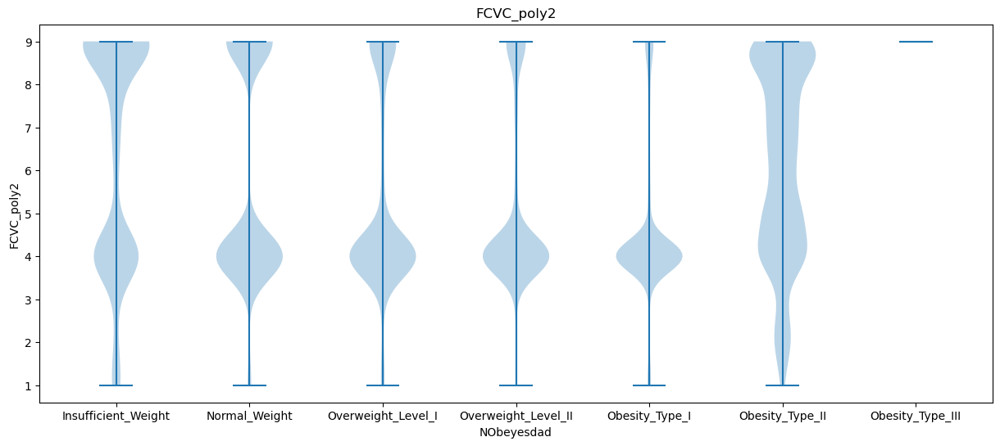

In [101]:
var = "FCVC"
X_train_poly_features[var+"_poly2"] = X_train_poly_features[var]**2
obesity_level_violin_plot(
    X_train_poly_features, y_train, 
    var+"_poly2", target_categories, 
    width=15, height=6)

**NCP**

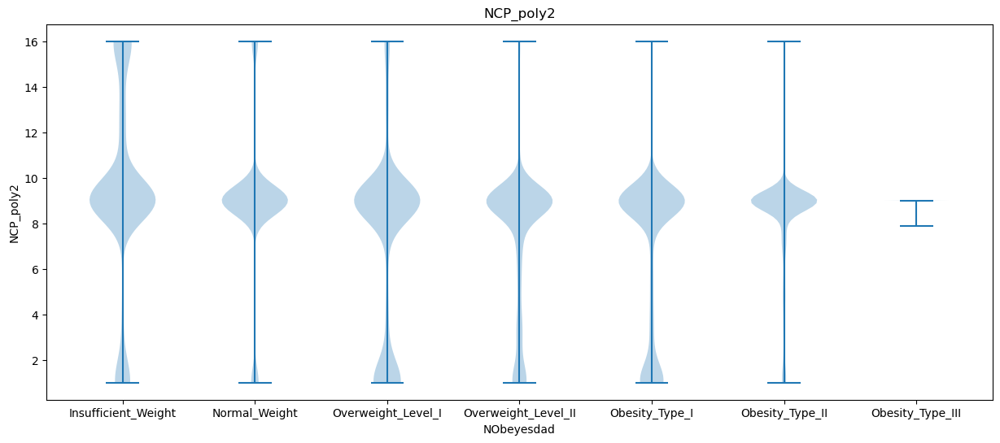

In [102]:
var = "NCP"
X_train_poly_features[var+"_poly2"] = X_train_poly_features[var]**2
obesity_level_violin_plot(
    X_train_poly_features, y_train, 
    var+"_poly2", target_categories, 
    width=15, height=6)

**CH2O**

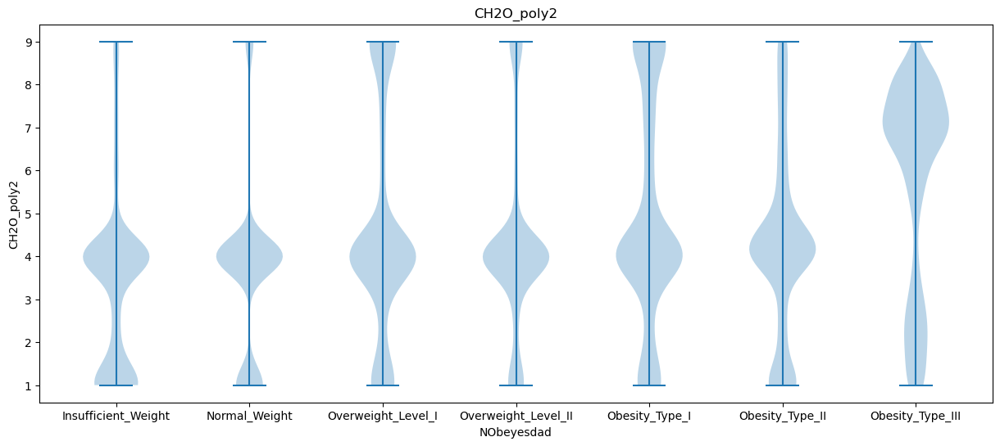

In [103]:
var = "CH2O"
X_train_poly_features[var+"_poly2"] = X_train_poly_features[var]**2
obesity_level_violin_plot(
    X_train_poly_features, y_train, 
    var+"_poly2", target_categories, 
    width=15, height=6)

**FAF**

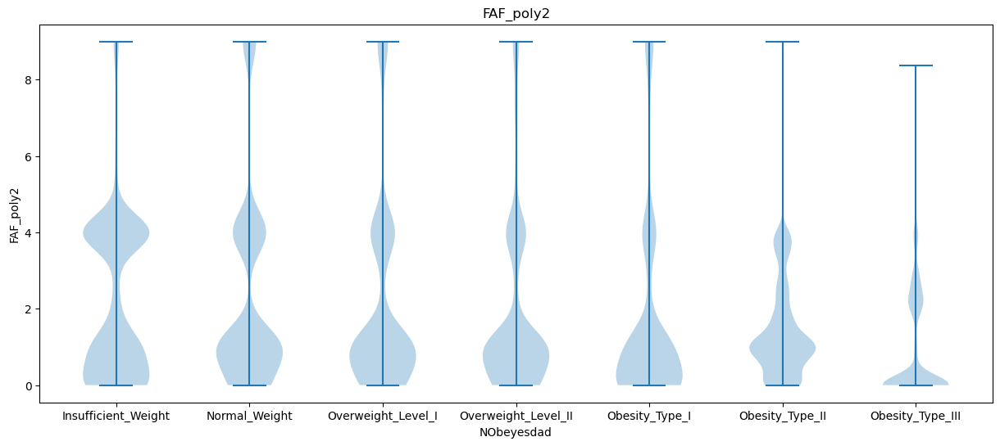

In [104]:
var = "FAF"
X_train_poly_features[var+"_poly2"] = X_train_poly_features[var]**2
obesity_level_violin_plot(
    X_train_poly_features, y_train, 
    var+"_poly2", target_categories, 
    width=15, height=6)

**TUE**

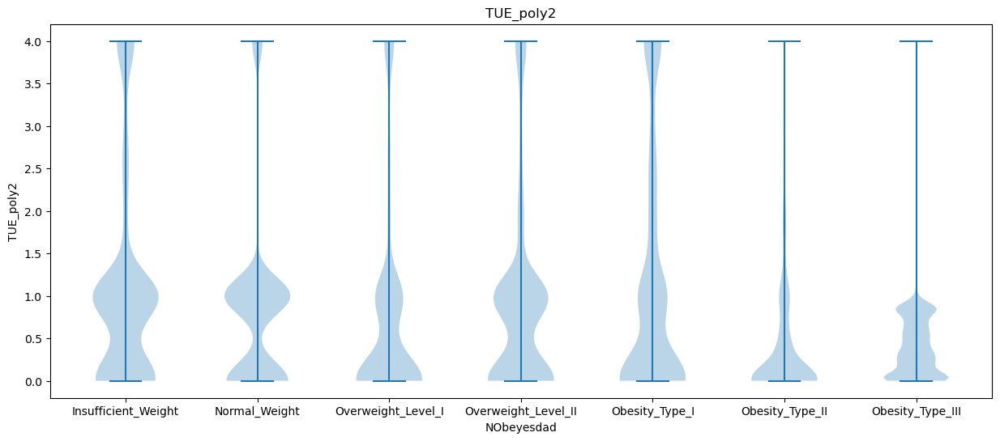

In [105]:
var = "TUE"
X_train_poly_features[var+"_poly2"] = X_train_poly_features[var]**2
obesity_level_violin_plot(
    X_train_poly_features, y_train, 
    var+"_poly2", target_categories, 
    width=15, height=6)

There aren't really any interesting transformations here, but you can try out other exponents.

#### 3.3.2.  Interaction terms

Interactions terms consist in building new variables from a combination, for example using sums or products.

In [106]:
X_train_inter_terms = X_train.copy()

In [107]:
def convert_categories_into_numerical(data):
    int_variables_into_categories = {
        "FCVC": {1:"Never", 2:"Sometimes", 3:"Always"},
        "NCP": {1:"1", 2:"2", 3:"3", 4:">3"},
        "CH2O": {1:"<1L", 2:"1-2L", 3:">2L"},
        "FAF": {0:"no", 1:"1_2d", 2:"2_4d", 3:"4_5d"},
        "TUE": {0:"0_2h", 1:"3_5h", 2:"+5h"}
    }
    int_variables_into_integers = {
        "FCVC": {"Never":1, "Sometimes":2, "Always":3},
        "NCP": {"1":1, "2":2, "3":3, ">3":4},
        "CH2O": {"<1L":1, "1-2L":2, ">2L":3},
        "FAF": {"no":0 , "1_2d":1 , "2_4d":2 , "4_5d":3},
        "TUE": {"0_2h":0 , "3_5h": 1, "+5h": 2}
    }
    for var in ["FCVC", "NCP", "CH2O", "FAF", "TUE"]:
        data[var] = data[var].round().astype(int)
        data[var] = data[var].apply(lambda x: int_variables_into_categories[var][x])

    eh_variables = ['FAVC', 'FCVC', 'NCP', 'CAEC', 'CH2O', 'CALC', "SMOKE"]
    eh_variables_categories = {
        "FAVC" : ["no", "yes"],
        "FCVC" : ["Never", "Sometimes", "Always"],
        "NCP" : ["1", "2", "3", ">3"],
        "CAEC" : ["no", "Sometimes", "Frequently", "Always"], 
        "CH2O" : ["<1L", "1-2L", ">2L"],
        "CALC" : ["no", "Sometimes", "Frequently", "Always"],
        "SMOKE" : ["no", "yes"]
    }
    eh_codes_list = [eh_variables_categories[var] for var in eh_variables]
    eh_oe = OrdinalEncoder(categories=eh_codes_list)
    data[eh_variables] = eh_oe.fit_transform(data[eh_variables])

    pc_variables = ['SCC', 'FAF', 'TUE', 'MTRANS', "family_history_with_overweight", "Gender"]
    pc_variables_categories = {
        "SCC" : ["no", "yes"],
        "FAF" : ["no", "1_2d", "2_4d", "4_5d"],
        "TUE" : ["0_2h", "3_5h", "+5h"],
        "MTRANS" : ['Automobile', 'Public_Transportation', 'Motorbike', 'Walking', 'Bike'],
        "family_history_with_overweight" : ["no", "yes"],
        "Gender" : ["Female", "Male"]
    }
    pc_codes_list = [pc_variables_categories[var] for var in pc_variables]
    pc_oe = OrdinalEncoder(categories=pc_codes_list)
    data[pc_variables] = pc_oe.fit_transform(data[pc_variables])
    
    return data

In [108]:
X_train_inter_terms = convert_categories_into_numerical(X_train_inter_terms)

In [109]:
scaler = MinMaxScaler()
X_train_inter_terms.iloc[:,1:] = scaler.fit_transform(X_train_inter_terms.drop(["id"], axis=1))

**Some attemps**

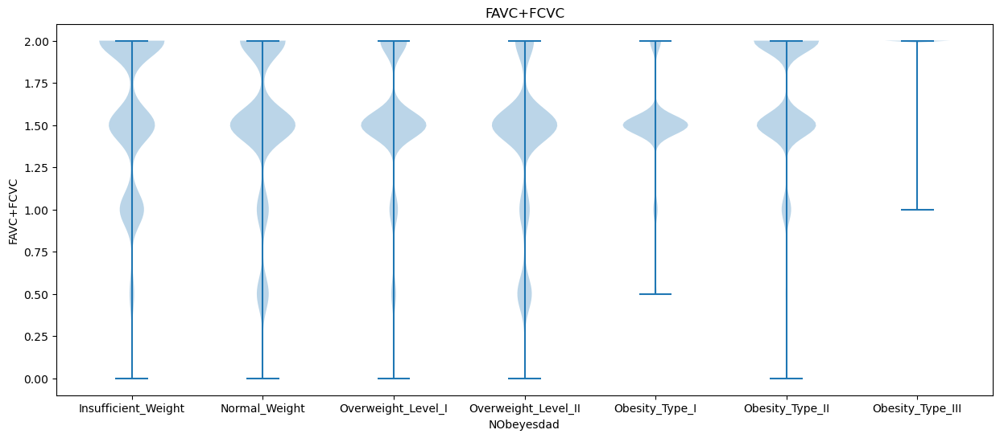

In [110]:
X_train_inter_terms["FAVC+FCVC"] = X_train_inter_terms[["FAVC", "FCVC"]].sum(axis=1)
var = "FAVC+FCVC"
obesity_level_violin_plot(
    X_train_inter_terms, y_train, 
    var, target_categories, 
    width=15, height=6)

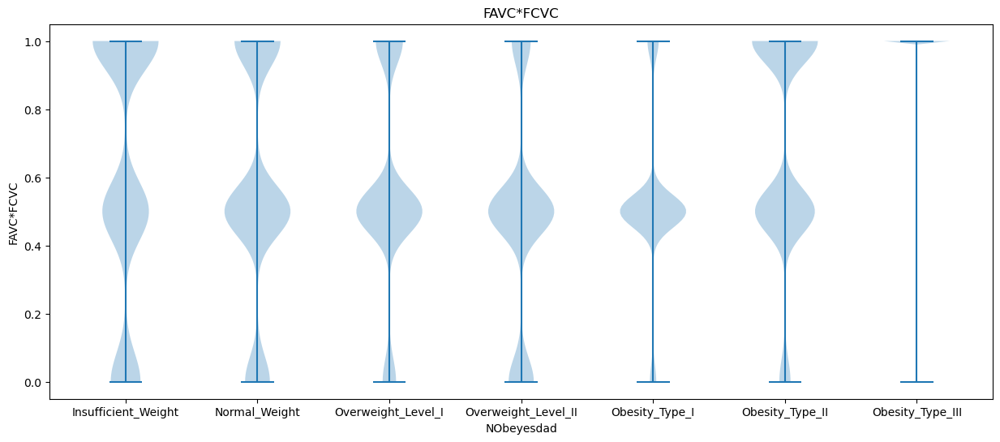

In [111]:
X_train_inter_terms["FAVC*FCVC"] = X_train_inter_terms[["FAVC", "FCVC"]].prod(axis=1)
var = "FAVC*FCVC"
obesity_level_violin_plot(
    X_train_inter_terms, y_train, 
    var, target_categories, 
    width=15, height=6)

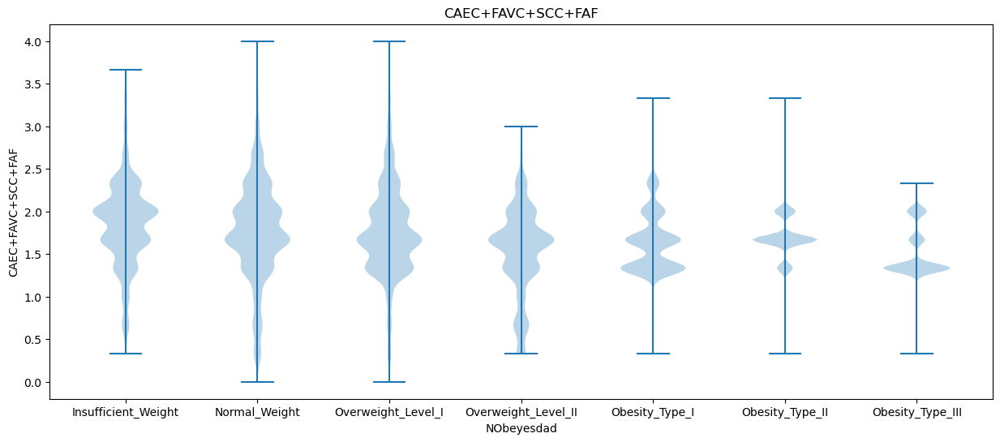

In [112]:
X_train_inter_terms["CAEC+FAVC+SCC+FAF"] = X_train_inter_terms[["CAEC", "FAVC", "SCC", "FAF"]].sum(axis=1)
var = "CAEC+FAVC+SCC+FAF"
obesity_level_violin_plot(
    X_train_inter_terms, y_train, 
    var, target_categories, 
    width=15, height=6)

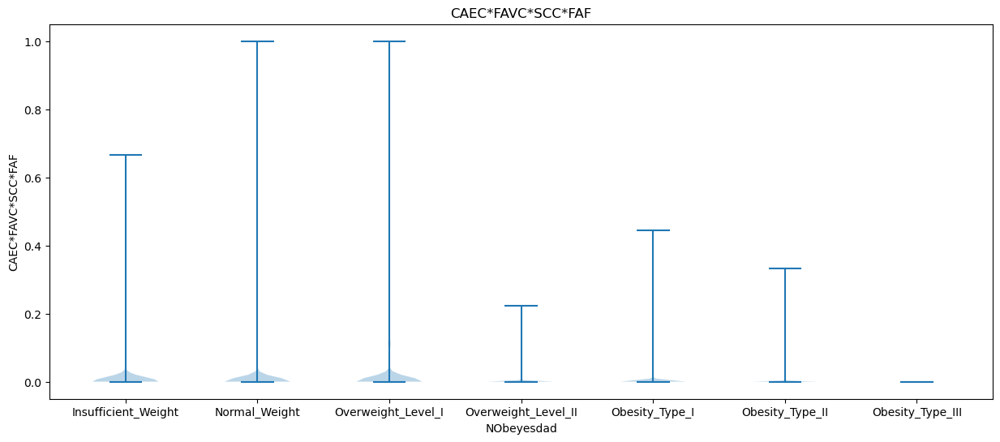

In [113]:
X_train_inter_terms["CAEC*FAVC*SCC*FAF"] = X_train_inter_terms[["CAEC", "FAVC", "SCC", "FAF"]].prod(axis=1)
var = "CAEC*FAVC*SCC*FAF"
obesity_level_violin_plot(
    X_train_inter_terms, y_train, 
    var, target_categories, 
    width=15, height=6)

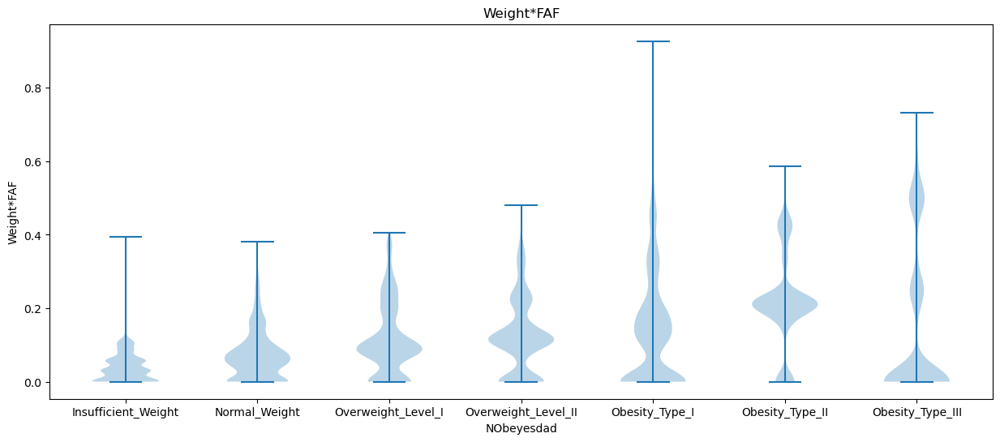

In [114]:
X_train_inter_terms["Weight*FAF"] = X_train_inter_terms[["Weight", "FAF"]].prod(axis=1)
var = "Weight*FAF"
obesity_level_violin_plot(
    X_train_inter_terms, y_train, 
    var, target_categories, 
    width=15, height=6)

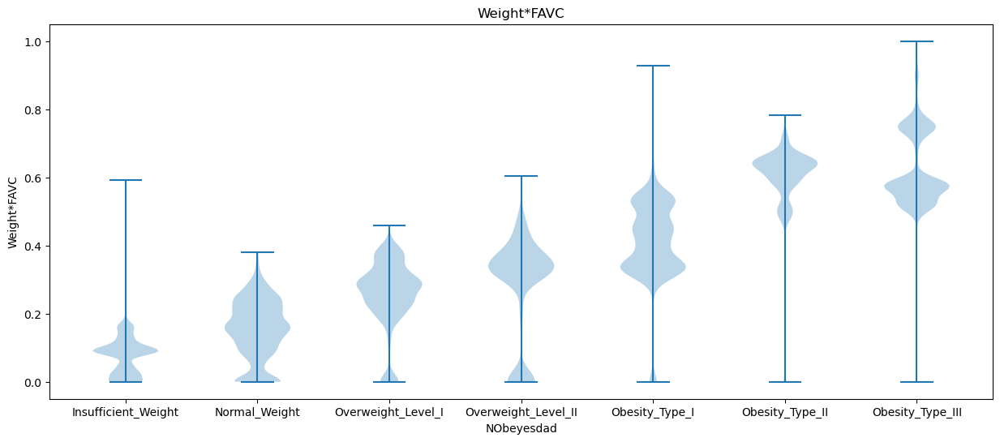

In [115]:
X_train_inter_terms["Weight*FAVC"] = X_train_inter_terms[["Weight", "FAVC"]].prod(axis=1)
var = "Weight*FAVC"
obesity_level_violin_plot(
    X_train_inter_terms, y_train, 
    var, target_categories, 
    width=15, height=6)

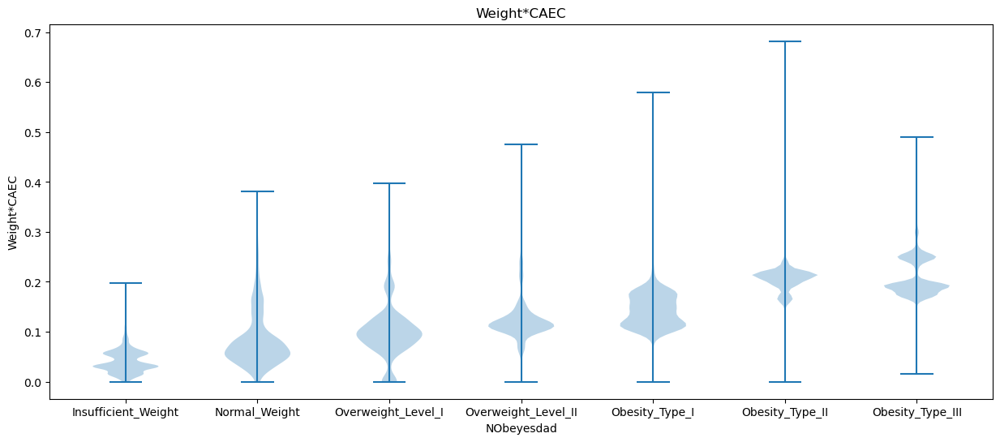

In [116]:
X_train_inter_terms["Weight*CAEC"] = X_train_inter_terms[["Weight", "CAEC"]].prod(axis=1)
var = "Weight*CAEC"
obesity_level_violin_plot(
    X_train_inter_terms, y_train, 
    var, target_categories, 
    width=15, height=6)

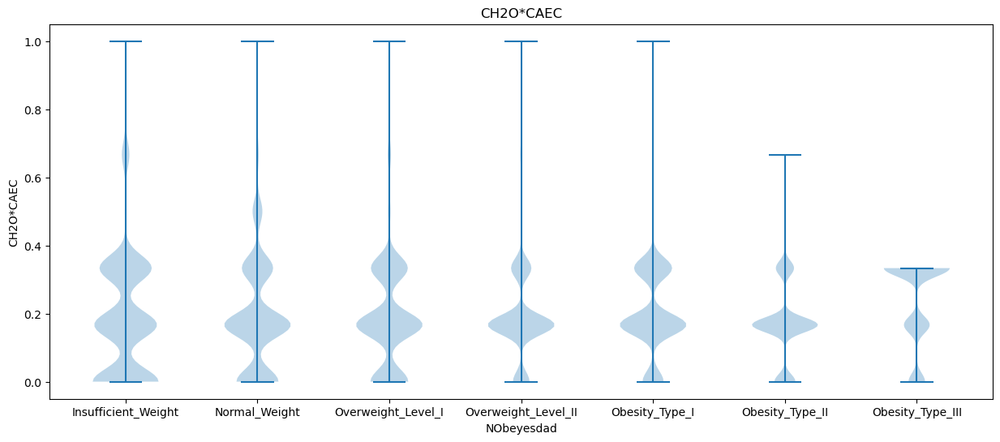

In [117]:
X_train_inter_terms["CH2O*CAEC"] = X_train_inter_terms[["CH2O", "CAEC"]].prod(axis=1)
var = "CH2O*CAEC"
obesity_level_violin_plot(
    X_train_inter_terms, y_train, 
    var, target_categories, 
    width=15, height=6)

There aren't really any interesting new vcariable here, but you can try out other combinations.

#### 3.3.3. Dimensionality Reduction

An other approach is the dimensionality reduction, which aims at summarizing the variables into less new ones (ideally a few ones).

It is important to normalize the variables before, otherwise some variables could be considered as "really important" whereas it is not actually the case and you would get a poor dimensionality reduction output.

In [118]:
# categories into numerical
X_train_dim_red = convert_categories_into_numerical(X_train.copy())
# min max normalization
scaler = MinMaxScaler()
X_train_dim_red.iloc[:,1:] = scaler.fit_transform(X_train_dim_red.drop(["id"], axis=1))

**PCA (Principal Component Analysis)**

Let's start with PCA:

In [119]:
%%time
pca = PCA()
pca.fit(X_train_dim_red.drop(["id"], axis=1))

CPU times: total: 0 ns
Wall time: 9 ms


PCA()

With PCA you can see how many new variables (components) you can keep in order to conserve as much information (variance) as possible.

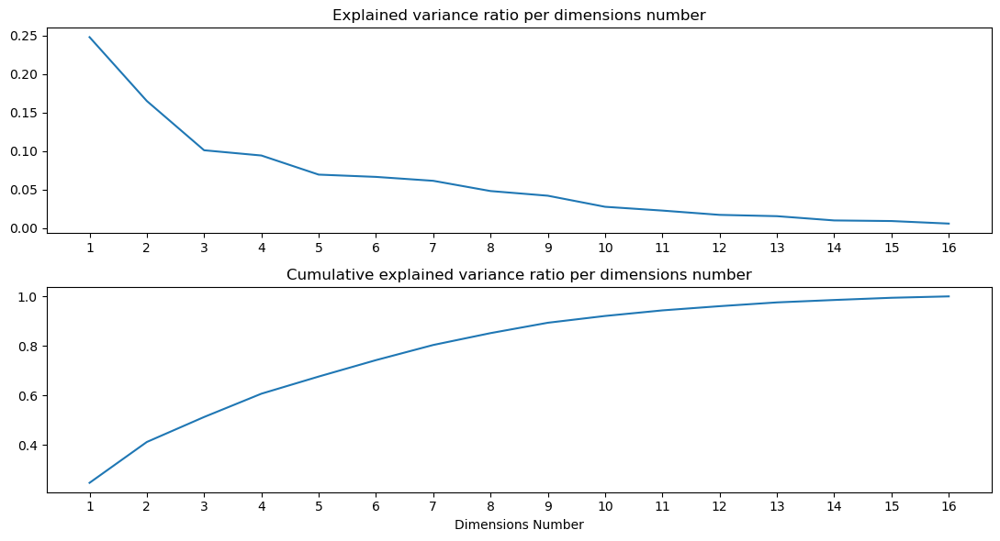

In [120]:
n_components = pca.n_components_
explained_variance_ratio = pca.explained_variance_ratio_
explained_variance_ratio_cumsum = np.cumsum(explained_variance_ratio)
fig, axs = plt.subplots(2, 1, figsize=(11,6))
axs[0].plot(np.arange(1, n_components+1).astype(int), explained_variance_ratio)
axs[0].set_title("Explained variance ratio per dimensions number")
axs[0].set_xticks(range(1, 17))
axs[1].plot(np.arange(1, n_components+1).astype(int), explained_variance_ratio_cumsum)
axs[1].set_title("Cumulative explained variance ratio per dimensions number")
axs[1].set_xlabel("Dimensions Number")
axs[1].set_xticks(range(1, 17))
plt.tight_layout()
plt.show()

Based on the elbow criterion we can keep 3 dimensions but unfortunately it keeps only about 50% of the variance.

In [121]:
X_train_pca3D = pca.transform(X_train_dim_red.drop(["id"], axis=1))[:,:3]
X_train_pca3D_df = pd.DataFrame(X_train_pca3D, columns=["DIM1", "DIM2", "DIM3"])

Let's look at the corresponding planes with individuals colored following their obesity level category.

**1-2 plane**

In [122]:
X_train_pca3D_df["y"] = y_train
fig = px.scatter(X_train_pca3D_df, x="DIM1", y="DIM2", color="y", opacity=0.1)
fig.update_layout(template="plotly_white")
fig.show()

**1-3 plane**

In [123]:
X_train_pca3D_df["y"] = y_train
fig = px.scatter(X_train_pca3D_df, x="DIM1", y="DIM3", color="y", opacity=0.1)
fig.update_layout(template="plotly_white")
fig.show()

**2-3 plane**

In [124]:
X_train_pca3D_df["y"] = y_train
fig = px.scatter(X_train_pca3D_df, x="DIM2", y="DIM3", color="y", opacity=0.1)
fig.update_layout(template="plotly_white")
fig.show()

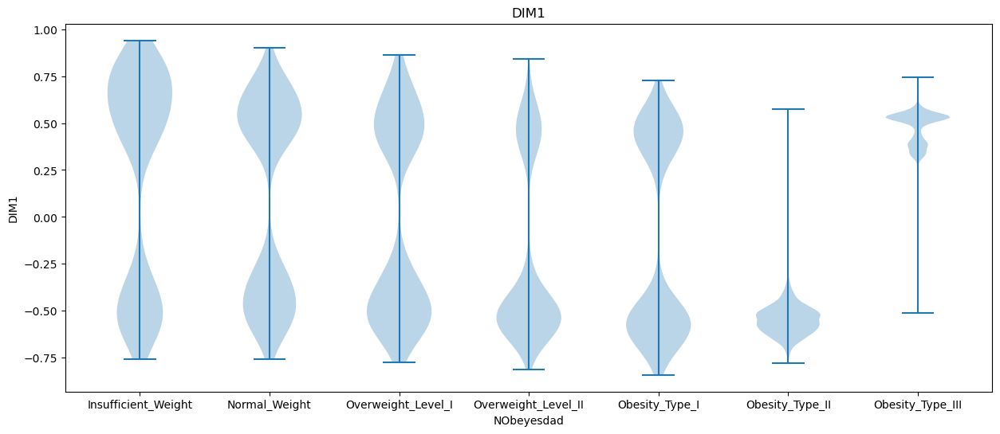

In [125]:
var = "DIM1"
obesity_level_violin_plot(
    X_train_pca3D_df, y_train, 
    var, target_categories, 
    width=15, height=6)

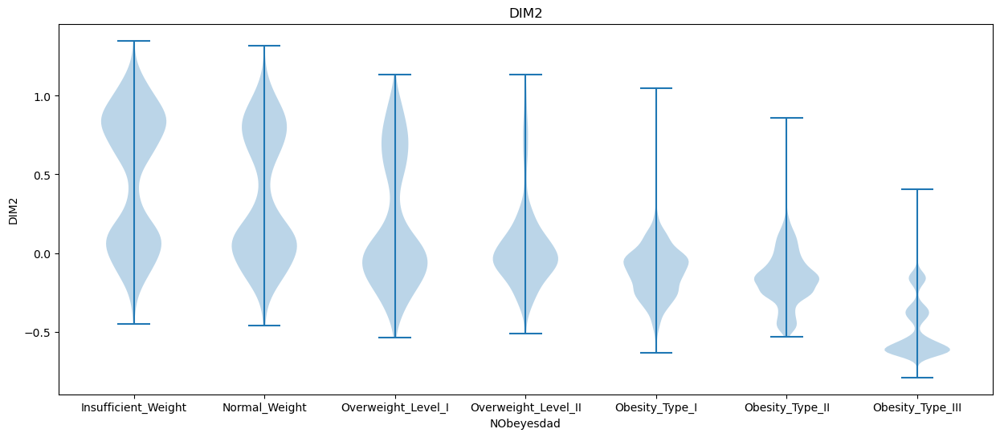

In [126]:
var = "DIM2"
obesity_level_violin_plot(
    X_train_pca3D_df, y_train, 
    var, target_categories, 
    width=15, height=6)

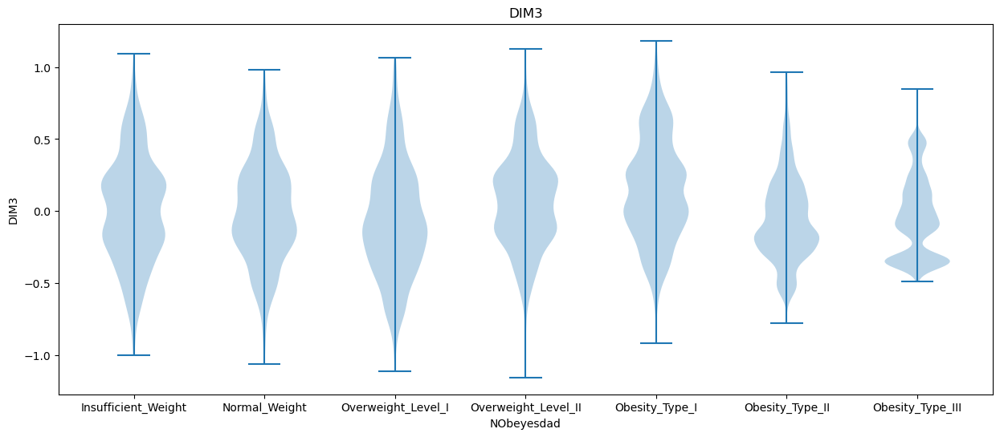

In [127]:
var = "DIM3"
obesity_level_violin_plot(
    X_train_pca3D_df, y_train, 
    var, target_categories, 
    width=15, height=6)

This dimensionality reduction doesn't seem to be good enough to classify the obesity level categories.

**Isomap**

Isomap will try to conserve the distance of individuals that are close to each others. 
We are going to keep 2 dimensions since this method is computationally expensive.

In [128]:
%%time
embedding = Isomap(n_components=2)
X_train_iso2D = embedding.fit_transform(X_train_dim_red.drop(["id"], axis=1))
X_train_iso2D_df = pd.DataFrame(X_train_iso2D, columns=["DIM1", "DIM2"])

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\manifold\_isomap.py:373: UserWarning:

The number of connected components of the neighbors graph is 45 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sp

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity struct

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity struct

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\scipy\sparse\_index.py:103: SparseEfficiencyWarning:

Changing the sparsity struct

CPU times: total: 2min 19s
Wall time: 1min 50s


Let's display the 1-2 plane:

In [129]:
X_train_iso2D_df["y"] = y_train
fig = px.scatter(X_train_iso2D_df, x="DIM1", y="DIM2", color="y", opacity=0.1)
fig.update_layout(template="plotly_white")
fig.show()

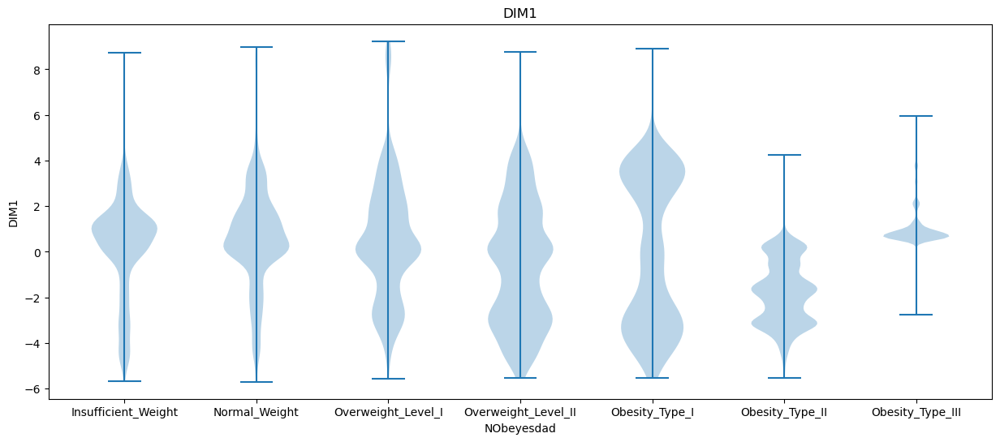

In [130]:
var = "DIM1"
obesity_level_violin_plot(
    X_train_iso2D_df, y_train, 
    var, target_categories, 
    width=15, height=6)

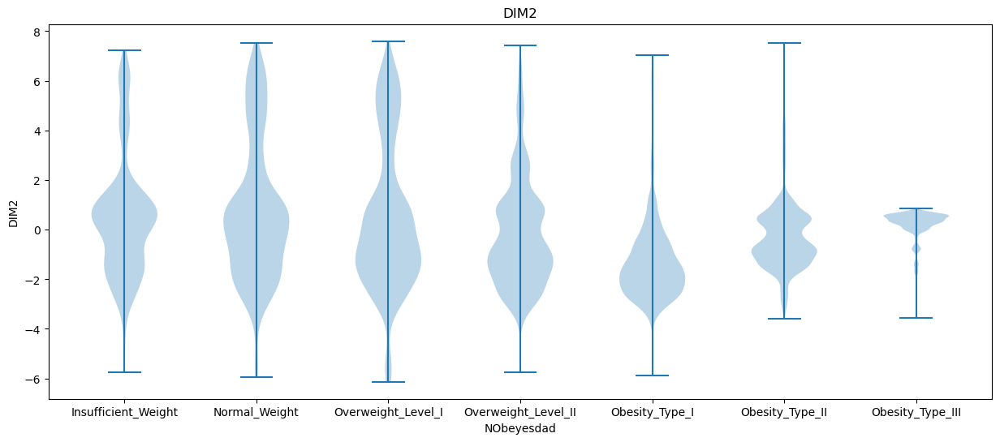

In [131]:
var = "DIM2"
obesity_level_violin_plot(
    X_train_iso2D_df, y_train, 
    var, target_categories, 
    width=15, height=6)

Here too we didn't obtain a result good enough to classify the obesity level categories.

**LLE** (Locally Linear Embedding)

Let's pass to the LLE method:

In [132]:
%%time
embedding = LocallyLinearEmbedding(n_components=2, n_neighbors=10)
X_train_lle2D = embedding.fit_transform(X_train_dim_red.drop(["id"], axis=1))
X_train_lle2D_df = pd.DataFrame(X_train_lle2D, columns=["DIM1", "DIM2"])

CPU times: total: 13 s
Wall time: 2.56 s


In [133]:
X_train_lle2D_df["y"] = y_train
fig = px.scatter(X_train_lle2D_df, x="DIM1", y="DIM2", color="y", opacity=0.1)
fig.update_layout(template="plotly_white")
fig.show()

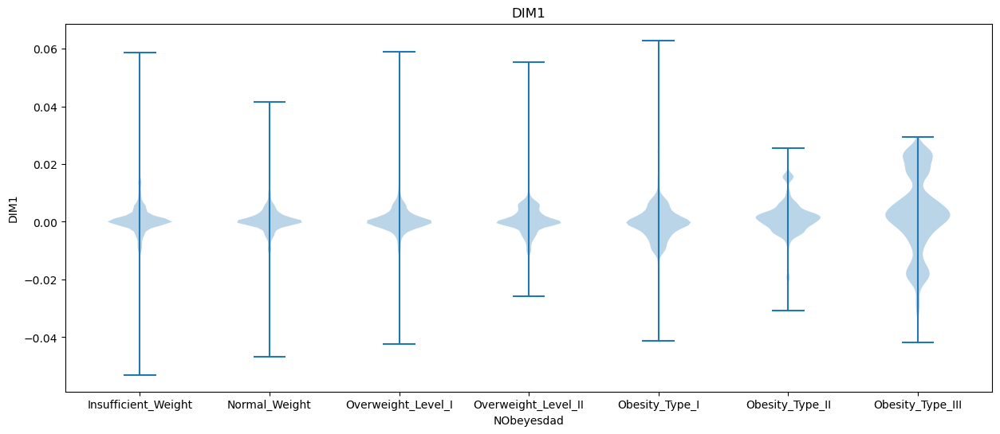

In [134]:
var = "DIM1"
obesity_level_violin_plot(
    X_train_lle2D_df, y_train, 
    var, target_categories, 
    width=15, height=6)

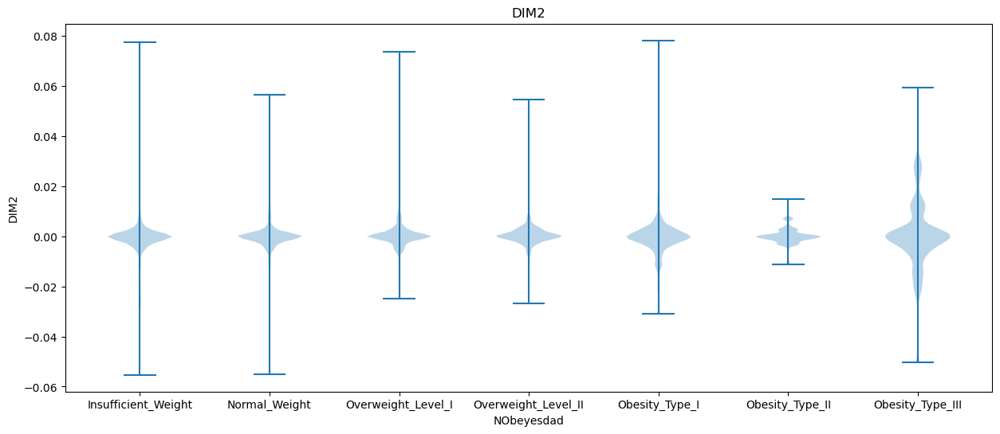

In [135]:
var = "DIM2"
obesity_level_violin_plot(
    X_train_lle2D_df, y_train, 
    var, target_categories, 
    width=15, height=6)

We didn't get something interesting neither.

Let's try with the modified LLE:

In [136]:
%%time
embedding = LocallyLinearEmbedding(
    n_components=2, n_neighbors=5, method='modified', eigen_solver='dense')
X_train_lle2D = embedding.fit_transform(X_train_dim_red.drop(["id"], axis=1))
X_train_lle2D_df = pd.DataFrame(X_train_lle2D, columns=["DIM1", "DIM2"])

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\manifold\_locally_linear.py:476: RuntimeWarning:

invalid value encountered in scalar divide



CPU times: total: 29min 48s
Wall time: 4min 59s


In [137]:
X_train_lle2D_df["y"] = y_train
fig = px.scatter(X_train_lle2D_df, x="DIM1", y="DIM2", color="y", opacity=0.1)
fig.update_layout(template="plotly_white")
fig.show()

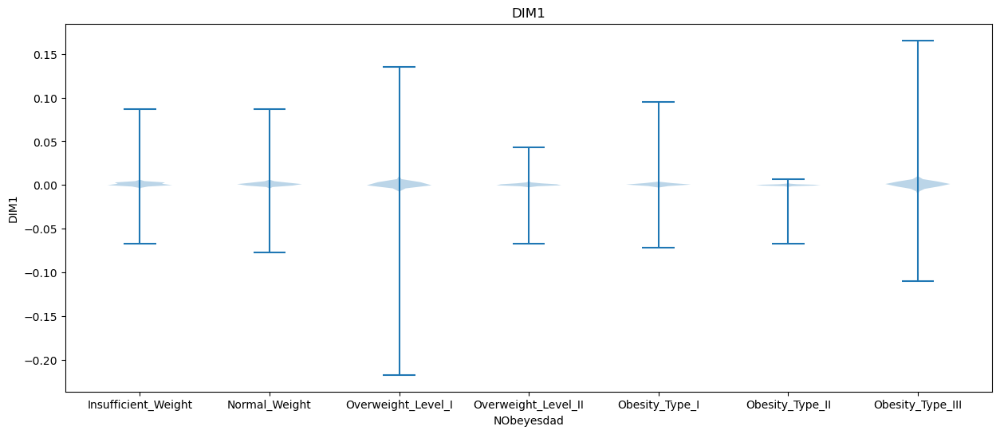

In [138]:
var = "DIM1"
obesity_level_violin_plot(
    X_train_lle2D_df, y_train, 
    var, target_categories, 
    width=15, height=6)

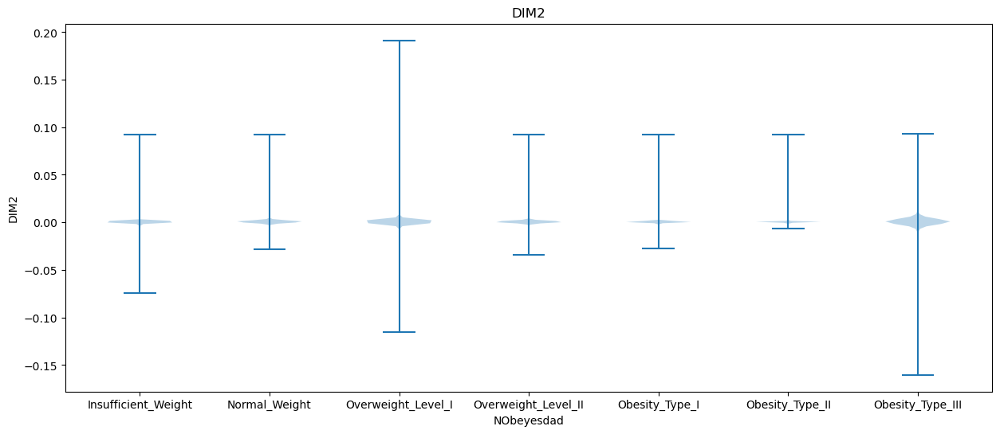

In [139]:
var = "DIM2"
obesity_level_violin_plot(
    X_train_lle2D_df, y_train, 
    var, target_categories, 
    width=15, height=6)

**Summary**

Let's summarize this Feature Engineering step:

* We are going to add the BMI variable.
* Convert the continuous variables corresponding to survey questions into categorical
* Encode categorical variables into continuous ones.
* Nomalize with the min-max method.

Below are the corresponding functions for complete data transformation:

In [140]:
def preprocessing(data):
    # new features
    data_features = data.copy()
    data_features["BMI"] = bmi_score(data_features)
    # encodage
    data_preprocessed = convert_categories_into_numerical(data_features.copy())
    # normalization
    scaler = MinMaxScaler()
    data_preprocessed.iloc[:,1:] = scaler.fit_transform(data_preprocessed.drop(["id"], axis=1))
    
    return data_preprocessed, data_features, scaler

def preprocessing_transform(data, scaler):
    # new features
    data_features = data.copy()
    data_features["BMI"] = bmi_score(data_features)
    columns = data_features.columns.values
    # encodage
    data_preprocessed = convert_categories_into_numerical(data_features.copy())
    # normalization
    data_preprocessed.iloc[:,1:] = scaler.transform(data_preprocessed.drop(["id"], axis=1))
    
    return data_preprocessed, data_features

Of course we could have try more methods and changed some parameters and we might have found something better. Feel free to try and see what happens!

## 4. Modeling

Finally, the modeling step.

We're going to process data, build benchmarks models, build a set of models and then tune hyper-parameters for the best models.

**Data Processing**

In [141]:
X_train_preprocessed, X_train_features, scaler = preprocessing(X_train)
X_test_preprocessed, X_test_features = preprocessing_transform(X_test, scaler)

### 4.1. Benchmark

We're going to define some benchmark models in order to see how much better the models we will build perform.

**Random Classifier**

Let's begin with a really simple one: a random classifier based on categories proportions of the train set.

In [142]:
def random_classifier_fit(data):
    labels, p = np.unique(data, return_counts=True)
    return {
        "labels" : labels,
        "p" : p/p.sum()
    }

def random_classifier_predict(data, clf):
    n = data.shape[0]
    labels = clf["labels"]
    p = clf["p"]
    return np.random.choice(target_categories, n, p=p)

And evaluate it using the KFold algorithm:

In [143]:
accuracies = []
kf = KFold(n_splits=10)
for i, (train_index, val_index) in enumerate(kf.split(X_train_preprocessed)):
    y_train_set, y_val_set = y_train[train_index], y_train[val_index]
    random_clf = random_classifier_fit(y_train_set)
    y_preds = random_classifier_predict(y_val_set, random_clf)
    accuracy = accuracy_score(y_val_set, y_preds)
    accuracies.append(accuracy)
    print(f"i:{i+1} - accuracy = {accuracy}")
print("mean accuracy =", np.mean(accuracies))

i:1 - accuracy = 0.14268512944009631
i:2 - accuracy = 0.14388922335942203
i:3 - accuracy = 0.15111378687537627
i:4 - accuracy = 0.14208308248043347
i:5 - accuracy = 0.1378687537627935
i:6 - accuracy = 0.14268512944009631
i:7 - accuracy = 0.13253012048192772
i:8 - accuracy = 0.14759036144578314
i:9 - accuracy = 0.14216867469879518
i:10 - accuracy = 0.14216867469879518
mean accuracy = 0.1424782936683519


We got a really low accuracy almost equals to $0.14 \sim 1/7$ which corresponds to the probability to have one category out of 7 with a uniform distribution.
Here the distribution is really close to a uniform one because the categories are well balanced.

**BMI categories**

Let's now define a classifier using BMI categories thresholds:

In [144]:
def bmi_classifier_predict(data):
    """
    * Underweight Less than 18.5
    * Normal 18.5 to 24.9
    * Overweight 25.0 to 29.9
    * Obesity I 30.0 to 34.9
    * Obesity II 35.0 to 39.9
    * Obesity III Higher than 40
    """
    bmis = (data["Weight"]/data["Height"]**2).values
    y_preds = np.tile("", bmis.shape[0]).astype("U32")
    # Underweight
    underweight_indexes = np.where(bmis < 18.5)[0]
    y_preds[underweight_indexes] = 'Insufficient_Weight'
    # Normal
    normal_indexes = np.intersect1d(np.where(bmis >= 18.5)[0], np.where(bmis < 25)[0])
    y_preds[normal_indexes] = 'Normal_Weight'
    # Overweight
    overweight_l1_indexes = np.intersect1d(np.where(bmis >= 25)[0], np.where(bmis < 27.5)[0])
    y_preds[overweight_l1_indexes] = 'Overweight_Level_I'
    overweight_l2_indexes = np.intersect1d(np.where(bmis >= 27.5)[0], np.where(bmis < 30)[0])
    y_preds[overweight_l2_indexes] = 'Overweight_Level_II'
    # Obesity
    obesity_t1_indexes = np.intersect1d(np.where(bmis >= 30)[0], np.where(bmis < 35)[0])
    y_preds[obesity_t1_indexes] = 'Obesity_Type_I'
    obesity_t2_indexes = np.intersect1d(np.where(bmis >= 35)[0], np.where(bmis < 40)[0])
    y_preds[obesity_t2_indexes] = 'Obesity_Type_II'
    obesity_t3_indexes = np.where(bmis >= 40)[0]
    y_preds[obesity_t3_indexes] = 'Obesity_Type_III'
    
    return y_preds

This model doesn't need to be fitted on any data, then we don't need to process any cross validation technique.

In [145]:
y_preds = bmi_classifier_predict(X_train_features)
accuracy = accuracy_score(y_train, y_preds)
print(accuracy)

0.7758039262917018


Here we got a **0.776** accuracy which is already a good score!

Let's move on to the actual modeling.

### 4.2. Modeling

Thanks to the benchmark models we know that a good model will perform better than 0.776.
Of course we want to get a model that will get an accuracy as close to 1 as possible but it is not always possible.

Since we're dealing with standard modeling (predicting a categorical variable from a table of continuous variables), we can test a large number of models.

Here's the list:
* Linear Discriminant Analysis (LDA)
* Decision Tree
* Support Vector Machine (SVM)
* Multi-layer Perceptron (MLP)
* Gaussian Naive Bayes
* k-nearest neighbors (KNN)
* Random Forest
* Gradient Boosting
* AdaBoost
* Bagging
* ExtraTrees

In order to be sure that we won't select a model that overfits, we're going to use a cross-validation technique.
There are a lot of them and you would find more details here: https://scikit-learn.org/stable/modules/cross_validation.html.

We're going to use the K-fold technique as we did with the benchmark random classifier.

In [146]:
results = []

In [147]:
def kfold_model_evaluation(X, y, model, verbose=True):
    t0 = time.time()
    accuracies = []
    kf = KFold(n_splits=10)
    for i, (train_index, val_index) in enumerate(kf.split(X)):
        X_train_set, X_val_set = X.iloc[train_index,:], X.iloc[val_index,:]
        y_train_set, y_val_set = y[train_index], y[val_index]
        # model init
        clf = model()
        # fit
        clf.fit(X_train_set, y_train_set)
        # predictions 
        y_preds = clf.predict(X_val_set)
        # evaluation
        accuracy = accuracy_score(y_val_set, y_preds)
        accuracies.append(accuracy)
        if verbose:
            print(f"i:{i+1} - accuracy = {accuracy}")
    mean_accuracy = np.mean(accuracies)
    t1 = time.time() - t0
    if verbose:
        print("mean accuracy =", mean_accuracy)
    return mean_accuracy, t1

#### 4.2.1. Linear Discriminant Analysis

Let's try 3 models:

In [148]:
model_name = "LDA-1"
model_params = dict(shrinkage=None, solver='svd')
model = partial(LinearDiscriminantAnalysis, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8356411800120409
i:2 - accuracy = 0.8199879590608068
i:3 - accuracy = 0.822998193859121
i:4 - accuracy = 0.831426851294401
i:5 - accuracy = 0.8260084286574353
i:6 - accuracy = 0.8368452739313667
i:7 - accuracy = 0.8307228915662651
i:8 - accuracy = 0.8240963855421687
i:9 - accuracy = 0.8234939759036145
i:10 - accuracy = 0.8114457831325301
mean accuracy = 0.826266692295975


In [149]:
model_name = "LDA-2"
model_params = dict(shrinkage='auto', solver='lsqr')
model = partial(LinearDiscriminantAnalysis, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8326309452137267
i:2 - accuracy = 0.8356411800120409
i:3 - accuracy = 0.822998193859121
i:4 - accuracy = 0.8452739313666466
i:5 - accuracy = 0.839855508729681
i:6 - accuracy = 0.8404575556893438
i:7 - accuracy = 0.8373493975903614
i:8 - accuracy = 0.8313253012048193
i:9 - accuracy = 0.8271084337349398
i:10 - accuracy = 0.8174698795180723
mean accuracy = 0.8330110326918753


In [150]:
model_name = "LDA-3"
model_params = dict(shrinkage='auto', solver='eigen')
model = partial(LinearDiscriminantAnalysis, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8326309452137267
i:2 - accuracy = 0.8356411800120409
i:3 - accuracy = 0.822998193859121
i:4 - accuracy = 0.8452739313666466
i:5 - accuracy = 0.839855508729681
i:6 - accuracy = 0.8404575556893438
i:7 - accuracy = 0.8373493975903614
i:8 - accuracy = 0.8313253012048193
i:9 - accuracy = 0.8271084337349398
i:10 - accuracy = 0.8174698795180723
mean accuracy = 0.8330110326918753


We got accuracies around **0.833** each which is not bad for a default model, this better than the bmi classifier.

#### 4.2.2. Decision Tree

In [151]:
model_name = "DT-1"
model_params = dict(random_state=seed)
model = partial(DecisionTreeClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8488862131246238
i:2 - accuracy = 0.8470800722456352
i:3 - accuracy = 0.8356411800120409
i:4 - accuracy = 0.8356411800120409
i:5 - accuracy = 0.8494882600842866
i:6 - accuracy = 0.8470800722456352
i:7 - accuracy = 0.8289156626506025
i:8 - accuracy = 0.8530120481927711
i:9 - accuracy = 0.8433734939759037
i:10 - accuracy = 0.8204819277108434
mean accuracy = 0.8409600110254383


In [152]:
model_name = "DT-2"
model_params = dict(criterion='gini', max_depth=10, min_samples_leaf=3, min_samples_split=2, random_state=seed)
model = partial(DecisionTreeClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8819987959060807
i:2 - accuracy = 0.8729680915111379
i:3 - accuracy = 0.8699578567128236
i:4 - accuracy = 0.868151715833835
i:5 - accuracy = 0.8753762793497892
i:6 - accuracy = 0.8747742323901264
i:7 - accuracy = 0.8710843373493976
i:8 - accuracy = 0.8710843373493976
i:9 - accuracy = 0.8813253012048192
i:10 - accuracy = 0.8710843373493976
mean accuracy = 0.8737805284956804


We got here a slighty better model: **0.874**.

#### 4.2.3. Support Vector Machine

**Linear SVM**

In [153]:
model_name = "SVM-lin-1"
model_params = dict(random_state=seed)
model = partial(LinearSVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.7423239012642986
i:2 - accuracy = 0.7260686333534015
i:3 - accuracy = 0.7332931968693558
i:4 - accuracy = 0.7332931968693558
i:5 - accuracy = 0.7465382299819386
i:6 - accuracy = 0.75316074653823
i:7 - accuracy = 0.7415662650602409
i:8 - accuracy = 0.7337349397590361
i:9 - accuracy = 0.7512048192771085
i:10 - accuracy = 0.727710843373494
mean accuracy = 0.738889477234646


In [154]:
model_name = "SVM-lin-2"
model_params = dict(
    C=10, dual=True, loss='hinge', multi_class='crammer_singer', 
    penalty='l1', tol=1e-05, random_state=seed)
model = partial(LinearSVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



i:1 - accuracy = 0.8699578567128236


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



i:2 - accuracy = 0.8537025888019265


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



i:3 - accuracy = 0.8458759783263095


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



i:4 - accuracy = 0.8603251053582179


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



i:5 - accuracy = 0.863937387116195


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



i:6 - accuracy = 0.8663455749548464


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



i:7 - accuracy = 0.8506024096385543


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



i:8 - accuracy = 0.8620481927710844


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



i:9 - accuracy = 0.8572289156626506
i:10 - accuracy = 0.8512048192771084
mean accuracy = 0.8581228828619718


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Accuracy: **0.858**

**Polynomial SVM**

In [155]:
model_name = "SVM-poly-1"
model_params = dict(kernel='poly', degree=3, random_state=seed)
model = partial(SVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8813967489464178
i:2 - accuracy = 0.8717639975918121
i:3 - accuracy = 0.8669476219145094
i:4 - accuracy = 0.876580373269115
i:5 - accuracy = 0.8795906080674293
i:6 - accuracy = 0.8832028898254064
i:7 - accuracy = 0.8771084337349397
i:8 - accuracy = 0.8759036144578313
i:9 - accuracy = 0.8789156626506024
i:10 - accuracy = 0.863855421686747
mean accuracy = 0.875526537214481


In [156]:
model_name = "SVM-poly-2"
model_params = dict(kernel='poly', degree=3, gamma=0.001, random_state=seed)
model = partial(SVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.20830824804334738
i:2 - accuracy = 0.18844069837447322
i:3 - accuracy = 0.18844069837447322
i:4 - accuracy = 0.17098133654425046
i:5 - accuracy = 0.1986754966887417
i:6 - accuracy = 0.19747140276941602
i:7 - accuracy = 0.19337349397590362
i:8 - accuracy = 0.19759036144578312
i:9 - accuracy = 0.2
i:10 - accuracy = 0.20060240963855422
mean accuracy = 0.19438841458549427


In [157]:
model_name = "SVM-poly-3"
model_params = dict(kernel='poly', degree=3, gamma=0.5, random_state=seed)
model = partial(SVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8807947019867549
i:2 - accuracy = 0.8711619506321493
i:3 - accuracy = 0.8687537627934979
i:4 - accuracy = 0.8771824202287778
i:5 - accuracy = 0.8795906080674293
i:6 - accuracy = 0.8813967489464178
i:7 - accuracy = 0.8728915662650603
i:8 - accuracy = 0.8795180722891566
i:9 - accuracy = 0.8789156626506024
i:10 - accuracy = 0.8632530120481928
mean accuracy = 0.8753458505908037


Accuracy: **0.875**

**RBF SVM**

In [158]:
model_name = "SVM-rbf-1"
model_params = dict(kernel='rbf', random_state=seed)
model = partial(SVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8735701384708007
i:2 - accuracy = 0.863937387116195
i:3 - accuracy = 0.856110776640578
i:4 - accuracy = 0.8699578567128236
i:5 - accuracy = 0.8801926550270921
i:6 - accuracy = 0.8826008428657435
i:7 - accuracy = 0.8674698795180723
i:8 - accuracy = 0.8608433734939759
i:9 - accuracy = 0.8746987951807229
i:10 - accuracy = 0.8548192771084338
mean accuracy = 0.8684200982134437


In [159]:
model_name = "SVM-rbf-2"
model_params = dict(kernel='rbf', gamma=0.005, random_state=seed)
model = partial(SVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.6736905478627333
i:2 - accuracy = 0.6598434677904876
i:3 - accuracy = 0.6447922937989163
i:4 - accuracy = 0.6556291390728477
i:5 - accuracy = 0.6767007826610476
i:6 - accuracy = 0.6598434677904876
i:7 - accuracy = 0.6692771084337349
i:8 - accuracy = 0.653012048192771
i:9 - accuracy = 0.6771084337349398
i:10 - accuracy = 0.6518072289156627
mean accuracy = 0.6621704518253629


In [160]:
model_name = "SVM-rbf-3"
model_params = dict(kernel='rbf', gamma=0.5, random_state=seed)
model = partial(SVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8717639975918121
i:2 - accuracy = 0.863937387116195
i:3 - accuracy = 0.8579169175195666
i:4 - accuracy = 0.8687537627934979
i:5 - accuracy = 0.8801926550270921
i:6 - accuracy = 0.8819987959060807
i:7 - accuracy = 0.8680722891566265
i:8 - accuracy = 0.8596385542168675
i:9 - accuracy = 0.8740963855421687
i:10 - accuracy = 0.8536144578313253
mean accuracy = 0.8679985202701233


Accuracy: **0.868**

**sigmoid SVM**

In [161]:
model_name = "SVM-sigmoid-1"
model_params = dict(kernel='sigmoid', random_state=seed)
model = partial(SVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.21794099939795303
i:2 - accuracy = 0.19446116797110174
i:3 - accuracy = 0.20108368452739314
i:4 - accuracy = 0.20349187236604455
i:5 - accuracy = 0.19446116797110174
i:6 - accuracy = 0.2107164358819988
i:7 - accuracy = 0.19578313253012047
i:8 - accuracy = 0.2
i:9 - accuracy = 0.20542168674698796
i:10 - accuracy = 0.21084337349397592
mean accuracy = 0.20342035208866777


In [162]:
model_name = "SVM-sigmoid-2"
model_params = dict(kernel='sigmoid', gamma=0.005, random_state=seed)
model = partial(SVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.5954244431065623
i:2 - accuracy = 0.5954244431065623
i:3 - accuracy = 0.5954244431065623
i:4 - accuracy = 0.6158940397350994
i:5 - accuracy = 0.6104756170981337
i:6 - accuracy = 0.6134858518964479
i:7 - accuracy = 0.6240963855421687
i:8 - accuracy = 0.6054216867469879
i:9 - accuracy = 0.6174698795180723
i:10 - accuracy = 0.608433734939759
mean accuracy = 0.6081550524796355


In [163]:
model_name = "SVM-sigmoid-3"
model_params = dict(kernel='sigmoid', gamma=0.5, random_state=seed)
model = partial(SVC, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.20891029500301023
i:2 - accuracy = 0.18904274533413606
i:3 - accuracy = 0.19145093317278747
i:4 - accuracy = 0.19807344972907887
i:5 - accuracy = 0.19024683925346178
i:6 - accuracy = 0.20650210716435882
i:7 - accuracy = 0.18734939759036146
i:8 - accuracy = 0.19457831325301206
i:9 - accuracy = 0.19518072289156627
i:10 - accuracy = 0.20301204819277108
mean accuracy = 0.1964346851584544


Accuracy: **0.608**

#### 4.2.4. Multi-layer Perceptron

In [164]:
model_name = "MLP-1"
model_params = dict(random_state=seed)
model = partial(MLPClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:1 - accuracy = 0.8795906080674293


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:2 - accuracy = 0.8699578567128236


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:3 - accuracy = 0.8531005418422637


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:4 - accuracy = 0.8813967489464178


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:5 - accuracy = 0.8868151715833835


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:6 - accuracy = 0.8862131246237207


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:7 - accuracy = 0.8734939759036144


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:8 - accuracy = 0.8728915662650603


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:9 - accuracy = 0.8819277108433735
i:10 - accuracy = 0.8698795180722891
mean accuracy = 0.8755266822860376


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



In [165]:
model_name = "MLP-2"
model_params = dict(max_iter=500, random_state=seed)
model = partial(MLPClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8759783263094522
i:2 - accuracy = 0.8657435279951836
i:3 - accuracy = 0.8537025888019265
i:4 - accuracy = 0.8783865141481035
i:5 - accuracy = 0.8886213124623721
i:6 - accuracy = 0.8747742323901264
i:7 - accuracy = 0.8656626506024097
i:8 - accuracy = 0.8728915662650603
i:9 - accuracy = 0.8849397590361445
i:10 - accuracy = 0.8680722891566265
mean accuracy = 0.8728772767167406


In [166]:
model_name = "MLP-3"
model_params = dict(batch_size=100, random_state=seed)
model = partial(MLPClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:1 - accuracy = 0.8826008428657435


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:2 - accuracy = 0.8675496688741722


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:3 - accuracy = 0.8549066827212523


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:4 - accuracy = 0.8795906080674293


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:5 - accuracy = 0.8856110776640578


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:6 - accuracy = 0.8826008428657435


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:7 - accuracy = 0.8656626506024097


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:8 - accuracy = 0.8728915662650603


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



i:9 - accuracy = 0.8801204819277109
i:10 - accuracy = 0.8704819277108434
mean accuracy = 0.8742016349564423


C:\Users\vanna\anaconda3\envs\personal_projects\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Accuracy: **0.875**

#### 4.2.5. Gaussian Naive Bayes

In [167]:
model_name = "GNB-1"
model_params = dict(var_smoothing=1e-06)
model = partial(GaussianNB, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.7838651414810355
i:2 - accuracy = 0.7543648404575557
i:3 - accuracy = 0.7676098735701384
i:4 - accuracy = 0.7760385310054184
i:5 - accuracy = 0.785671282360024
i:6 - accuracy = 0.794099939795304
i:7 - accuracy = 0.7740963855421686
i:8 - accuracy = 0.7734939759036145
i:9 - accuracy = 0.7813253012048192
i:10 - accuracy = 0.7662650602409639
mean accuracy = 0.7756830331561042


In [168]:
model_name = "GNB-2"
model_params = dict(var_smoothing=1e-09)
model = partial(GaussianNB, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.7820590006020469
i:2 - accuracy = 0.7537627934978929
i:3 - accuracy = 0.7664057796508128
i:4 - accuracy = 0.7760385310054184
i:5 - accuracy = 0.7844671884406984
i:6 - accuracy = 0.7922937989163155
i:7 - accuracy = 0.7734939759036145
i:8 - accuracy = 0.7710843373493976
i:9 - accuracy = 0.7813253012048192
i:10 - accuracy = 0.766867469879518
mean accuracy = 0.7747798176450533


In [169]:
model_name = "GNB-3"
model_params = dict(var_smoothing=1e-02)
model = partial(GaussianNB, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.7561709813365443
i:2 - accuracy = 0.7206502107164359
i:3 - accuracy = 0.7230583985550872
i:4 - accuracy = 0.7308850090307044
i:5 - accuracy = 0.7459361830222757
i:6 - accuracy = 0.7435279951836243
i:7 - accuracy = 0.7439759036144579
i:8 - accuracy = 0.7295180722891567
i:9 - accuracy = 0.7397590361445783
i:10 - accuracy = 0.7289156626506024
mean accuracy = 0.7362397452543468


Accuracy: **0.775**

#### 4.2.6. K-nearest neighbors

In [170]:
model_name = "KNN-1"
model_params = dict(n_neighbors=5)
model = partial(KNeighborsClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.7513546056592414
i:2 - accuracy = 0.7399157134256472
i:3 - accuracy = 0.7387116195063215
i:4 - accuracy = 0.7447320891029501
i:5 - accuracy = 0.7477423239012643
i:6 - accuracy = 0.7645996387718242
i:7 - accuracy = 0.7409638554216867
i:8 - accuracy = 0.7409638554216867
i:9 - accuracy = 0.7271084337349397
i:10 - accuracy = 0.7451807228915662
mean accuracy = 0.7441272857837129


In [171]:
model_name = "KNN-2"
model_params = dict(n_neighbors=30)
model = partial(KNeighborsClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.7146297411198074
i:2 - accuracy = 0.7206502107164359
i:3 - accuracy = 0.7068031306441902
i:4 - accuracy = 0.7140276941601444
i:5 - accuracy = 0.7375075255869958
i:6 - accuracy = 0.7218543046357616
i:7 - accuracy = 0.7174698795180723
i:8 - accuracy = 0.7289156626506024
i:9 - accuracy = 0.7283132530120482
i:10 - accuracy = 0.708433734939759
mean accuracy = 0.7198605136983818


In [172]:
model_name = "KNN-3"
model_params = dict(algorithm='ball_tree', n_neighbors=30, p=1, weights='distance')
model = partial(KNeighborsClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8043347381095726
i:2 - accuracy = 0.7977122215532811
i:3 - accuracy = 0.7904876580373269
i:4 - accuracy = 0.8085490668272125
i:5 - accuracy = 0.8223961468994582
i:6 - accuracy = 0.8211920529801324
i:7 - accuracy = 0.8078313253012048
i:8 - accuracy = 0.8072289156626506
i:9 - accuracy = 0.8096385542168675
i:10 - accuracy = 0.7927710843373494
mean accuracy = 0.8062141763925057


Accuracy: **0.806**

#### 4.2.7. Random Forest

In [173]:
model_name = "RF-1"
model_params = dict(random_state=seed)
model = partial(RandomForestClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.9024683925346177
i:2 - accuracy = 0.8922335942203492
i:3 - accuracy = 0.8916315472606864
i:4 - accuracy = 0.9000602046959663
i:5 - accuracy = 0.9036724864539434
i:6 - accuracy = 0.8964479229379891
i:7 - accuracy = 0.8891566265060241
i:8 - accuracy = 0.9012048192771084
i:9 - accuracy = 0.9042168674698795
i:10 - accuracy = 0.8837349397590362
mean accuracy = 0.8964827401115599


In [174]:
model_name = "RF-2"
model_params = dict(bootstrap=False, criterion='gini', max_depth=None, min_samples_leaf=1, 
    min_samples_split=6, random_state=seed)
model = partial(RandomForestClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.9018663455749548
i:2 - accuracy = 0.8952438290186635
i:3 - accuracy = 0.8904274533413606
i:4 - accuracy = 0.9072847682119205
i:5 - accuracy = 0.9018663455749548
i:6 - accuracy = 0.8994581577363034
i:7 - accuracy = 0.8921686746987951
i:8 - accuracy = 0.9036144578313253
i:9 - accuracy = 0.9012048192771084
i:10 - accuracy = 0.8885542168674698
mean accuracy = 0.8981689068132855


Accuracy: **0.898**

#### 4.2.8. Gradient Boosting

In [175]:
model_name = "GB-1"
model_params = dict(random_state=seed)
model = partial(GradientBoostingClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.901264298615292
i:2 - accuracy = 0.8952438290186635
i:3 - accuracy = 0.8940397350993378
i:4 - accuracy = 0.8970499698976521
i:5 - accuracy = 0.9036724864539434
i:6 - accuracy = 0.9006622516556292
i:7 - accuracy = 0.8891566265060241
i:8 - accuracy = 0.9012048192771084
i:9 - accuracy = 0.903012048192771
i:10 - accuracy = 0.8963855421686747
mean accuracy = 0.8981691606885096


In [176]:
model_name = "GB-2"
model_params = dict(criterion='squared_error', learning_rate=0.1, loss='log_loss', 
    max_depth=5, max_features='sqrt', random_state=seed)
model = partial(GradientBoostingClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.9036724864539434
i:2 - accuracy = 0.8988561107766406
i:3 - accuracy = 0.8988561107766406
i:4 - accuracy = 0.9054786273329319
i:5 - accuracy = 0.9084888621312462
i:6 - accuracy = 0.9054786273329319
i:7 - accuracy = 0.8903614457831325
i:8 - accuracy = 0.8981927710843374
i:9 - accuracy = 0.908433734939759
i:10 - accuracy = 0.8945783132530121
mean accuracy = 0.9012397089864574


Accuracy: **0.901**

#### 4.2.9. AdaBoost

In [177]:
model_name = "AdaB-1"
model_params = dict(random_state=seed)
model = partial(AdaBoostClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.6345574954846478
i:2 - accuracy = 0.5978326309452138
i:3 - accuracy = 0.5869957856712824
i:4 - accuracy = 0.6640577965081277
i:5 - accuracy = 0.645996387718242
i:6 - accuracy = 0.49367850692354004
i:7 - accuracy = 0.558433734939759
i:8 - accuracy = 0.6493975903614457
i:9 - accuracy = 0.6277108433734939
i:10 - accuracy = 0.6421686746987951
mean accuracy = 0.6100829446624548


In [178]:
model_name = "AdaB-2"
model_params = dict(learning_rate=1.0, random_state=seed)
model = partial(AdaBoostClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.6345574954846478
i:2 - accuracy = 0.5978326309452138
i:3 - accuracy = 0.5869957856712824
i:4 - accuracy = 0.6640577965081277
i:5 - accuracy = 0.645996387718242
i:6 - accuracy = 0.49367850692354004
i:7 - accuracy = 0.558433734939759
i:8 - accuracy = 0.6493975903614457
i:9 - accuracy = 0.6277108433734939
i:10 - accuracy = 0.6421686746987951
mean accuracy = 0.6100829446624548


Accuracy: **0.610**

#### 4.2.10. Bagging

In [179]:
model_name = "Bag-1"
model_params = dict(random_state=seed)
model = partial(BaggingClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8832028898254064
i:2 - accuracy = 0.8705599036724865
i:3 - accuracy = 0.8741721854304636
i:4 - accuracy = 0.8771824202287778
i:5 - accuracy = 0.8813967489464178
i:6 - accuracy = 0.8771824202287778
i:7 - accuracy = 0.8650602409638555
i:8 - accuracy = 0.8801204819277109
i:9 - accuracy = 0.8837349397590362
i:10 - accuracy = 0.8644578313253012
mean accuracy = 0.8757070062308234


In [180]:
model_name = "Bag-2"
model_params = dict(estimator=DecisionTreeClassifier(), bootstrap=True, n_estimators=100, 
    random_state=seed)
model = partial(BaggingClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.901264298615292
i:2 - accuracy = 0.8807947019867549
i:3 - accuracy = 0.8838049367850692
i:4 - accuracy = 0.8886213124623721
i:5 - accuracy = 0.8910295003010235
i:6 - accuracy = 0.8880192655027093
i:7 - accuracy = 0.8777108433734939
i:8 - accuracy = 0.8945783132530121
i:9 - accuracy = 0.8891566265060241
i:10 - accuracy = 0.8765060240963856
mean accuracy = 0.8871485822882137


Accuracy: **0.887**

#### 4.2.11. ExtraTrees

In [181]:
model_name = "ET-1"
model_params = dict(random_state=seed)
model = partial(ExtraTreesClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8898254063816978
i:2 - accuracy = 0.8916315472606864
i:3 - accuracy = 0.8838049367850692
i:4 - accuracy = 0.8964479229379891
i:5 - accuracy = 0.8916315472606864
i:6 - accuracy = 0.8904274533413606
i:7 - accuracy = 0.8795180722891566
i:8 - accuracy = 0.8933734939759036
i:9 - accuracy = 0.8921686746987951
i:10 - accuracy = 0.8728915662650603
mean accuracy = 0.8881720621196406


In [182]:
model_name = "ET-2"
model_params = dict(bootstrap=False, criterion='entropy', max_depth=None, 
    min_samples_leaf=1, min_samples_split=10, random_state=seed)
model = partial(ExtraTreesClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8922335942203492
i:2 - accuracy = 0.8916315472606864
i:3 - accuracy = 0.8832028898254064
i:4 - accuracy = 0.901264298615292
i:5 - accuracy = 0.901264298615292
i:6 - accuracy = 0.8988561107766406
i:7 - accuracy = 0.886144578313253
i:8 - accuracy = 0.8981927710843374
i:9 - accuracy = 0.8969879518072289
i:10 - accuracy = 0.8783132530120482
mean accuracy = 0.8928091293530536


Accuracy: **0.893**

Here are the results:

In [183]:
results_df = pd.DataFrame(results, columns=["model", "accuracy", "time"])
results_df

,model,accuracy,time
0,LDA-1,0.826267,0.551733
1,LDA-2,0.833011,0.640986
2,LDA-3,0.833011,0.666773
3,DT-1,0.840960,0.793715
4,DT-2,0.873781,0.558010
5,SVM-lin-1,0.738889,5.641490
6,SVM-lin-2,0.858123,33.331901
7,SVM-poly-1,0.875527,16.756768
8,SVM-poly-2,0.194388,109.840986
9,SVM-poly-3,0.875346,16.476363


And here the top 10:

In [184]:
results_df.sort_values(by="accuracy", ascending=False).reset_index(drop=True).head(10)

,model,accuracy,time
0,GB-2,0.901240,65.082131
1,GB-1,0.898169,116.408175
2,RF-2,0.898169,17.640831
3,RF-1,0.896483,14.236233
4,ET-2,0.892809,8.509538
5,ET-1,0.888172,10.120207
6,Bag-2,0.887149,45.732133
7,Bag-1,0.875707,4.776565
8,MLP-1,0.875527,64.947956
9,SVM-poly-1,0.875527,16.756768


Ensemble models are those that perform the best, there are also MLP and Kernel SVM though.

The most promising models are Gradient Boosting and Random Forest.

Let's try to improve their performances by tuning their hyper-parameters.

### 4.3. Hyper-parameters Tuning

The hyper-parameters tuning phase corresponds to the evaluation of a model according to different parameters and then try to find the best model.

So there are a lot of models to fit and evaluate which can take a long time depeding of the combinations of parameters we want to test.

In order to accelerate the fitting step, we are going to use the XGBoost classifier from the xgboost library instead of the Gradient Boosting we used.

Also we are going to train ExtraTree instead of Random Forest that have similar performances.

#### 4.3.1. ExtraTree

In order to do a grid search, you just have to choose ranges of values per parameter. 
Below you can see `param_grid` a dictionnary containing a list of values for each parameter.
The `GridSearchCV` will fit and evaluate a model for each combination of these parameters `cv` times.
The more parameters and values per parameter you will set the longer the runtime will be.
If we note $n_i$ the number of values set on the i-th parameter and $n_{\text{cv}}$ the number of cross-validations for each combination.
Then the number of fit will be:
$$
n_{\text{fit}} = n_{\text{cv}} \prod_{i=1}^N n_i
$$

In [185]:
%%time
param_grid = {
    'n_estimators' : [50, 100, 200],
    'criterion' : ['gini', 'entropy', 'log_loss'], 
    'max_depth' : [3, 5, 10, 50, 100, None],
    'min_samples_leaf' : [1, 5], 
    'min_samples_split' : [2, 10, 15]
}
model = ExtraTreesClassifier(random_state=seed)
clf = GridSearchCV(model, param_grid, cv=10, verbose=4, n_jobs=-1)
clf.fit(X_train_preprocessed.drop(["id"], axis=1), y_train)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
CPU times: total: 18.1 s
Wall time: 6min 6s


GridSearchCV(cv=10, estimator=ExtraTreesClassifier(random_state=123), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [3, 5, 10, 50, 100, None],
                         'min_samples_leaf': [1, 5],
                         'min_samples_split': [2, 10, 15],
                         'n_estimators': [50, 100, 200]},
             verbose=4)

Let's look at the results:

In [186]:
gs_results = clf.cv_results_
gs_best_params = clf.best_params_
gs_best_score = clf.best_score_
gs_best_estimator = clf.best_estimator_

In [187]:
n_candidates = gs_results['mean_test_score'].shape[0]
gs_params = list(gs_results['params'][0].keys())
n_parameters = len(gs_params)
gs_params.extend(["score"])
gs_results_df = pd.DataFrame(np.zeros((n_candidates,n_parameters+1)), columns=gs_params)
gs_results_df["score"] = gs_results['mean_test_score']
for i in range(n_candidates):
    for j in range(n_parameters):
        gs_results_df.iloc[i, j] = gs_results['params'][i][gs_params[j]]

In [188]:
gs_results_df.sort_values(by="score", ascending=False).head(10)

,criterion,max_depth,min_samples_leaf,min_samples_split,n_estimators,score
77,gini,100.0,1.0,10.0,200.0,0.894977
95,gini,NaN,1.0,10.0,200.0,0.894977
59,gini,50.0,1.0,10.0,200.0,0.894977
94,gini,NaN,1.0,10.0,100.0,0.894615
76,gini,100.0,1.0,10.0,100.0,0.894615
58,gini,50.0,1.0,10.0,100.0,0.894495
296,log_loss,100.0,1.0,15.0,200.0,0.894074
206,entropy,NaN,1.0,15.0,200.0,0.894074
188,entropy,100.0,1.0,15.0,200.0,0.894074
170,entropy,50.0,1.0,15.0,200.0,0.894074


In [189]:
gs_best_params

{'criterion': 'gini',
 'max_depth': 100,
 'min_samples_leaf': 1,
 'min_samples_split': 10,
 'n_estimators': 200}

Let's see the resulting model performance with the best parameters:

In [190]:
model_name = "ET-3-gs"
model_params = gs_best_params
model = partial(ExtraTreesClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.8982540638169777
i:2 - accuracy = 0.8856110776640578
i:3 - accuracy = 0.8838049367850692
i:4 - accuracy = 0.9054786273329319
i:5 - accuracy = 0.8994581577363034
i:6 - accuracy = 0.9000602046959663
i:7 - accuracy = 0.8849397590361445
i:8 - accuracy = 0.9012048192771084
i:9 - accuracy = 0.8969879518072289
i:10 - accuracy = 0.8801204819277109
mean accuracy = 0.8935920080079498


Accuracy: **0.893**

The accuracy didn't improve.

#### 4.3.2. XGBoost

XGBoost comes from the xgboost library you will have to install with conda or pip.

We have to process the target variable here, we just need to convert it into a continuous one. 
To do so we will just use the ordinal encoder as we did it for the features:

In [191]:
target_categories_oe = OrdinalEncoder(categories=[target_categories])
y_train_preprocessed = target_categories_oe.fit_transform(pd.DataFrame(y_train, columns=["y"])).flatten()

Let's grid search now the best parameters:

In [192]:
%%time
param_grid = {
    'n_estimators' : [100, 200, 300],
    'max_depth' : [3, 5, 10, 50, None],
    'learning_rate' : [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]
}
model = XGBClassifier(random_state=seed)
clf = GridSearchCV(model, param_grid, cv=10, verbose=4, n_jobs=-1)
clf.fit(X_train_preprocessed.drop(["id"], axis=1), y_train_preprocessed)

Fitting 10 folds for each of 105 candidates, totalling 1050 fits
CPU times: total: 49.1 s
Wall time: 42min 3s


GridSearchCV(cv=10,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=123, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.005, 0.01, 0.05, 0.1, 0.5,
                                           1],
                         'max_depth': [3, 5, 10, 50, None],
                         'n_estimators': [100, 200, 300]},
             verbose=4)

Then the results:

In [193]:
gs_results = clf.cv_results_
gs_best_params = clf.best_params_
gs_best_score = clf.best_score_
gs_best_estimator = clf.best_estimator_

In [194]:
n_candidates = gs_results['mean_test_score'].shape[0]
gs_params = list(gs_results['params'][0].keys())
n_parameters = len(gs_params)
gs_params.extend(["score"])
gs_results_df = pd.DataFrame(np.zeros((n_candidates,n_parameters+1)), columns=gs_params)
gs_results_df["score"] = gs_results['mean_test_score']
for i in range(n_candidates):
    for j in range(n_parameters):
        gs_results_df.iloc[i, j] = gs_results['params'][i][gs_params[j]]

In [195]:
gs_results_df.sort_values(by="score", ascending=False).head(10)

,learning_rate,max_depth,n_estimators,score
62,0.10,3.0,300.0,0.904913
73,0.10,NaN,200.0,0.903528
65,0.10,5.0,300.0,0.903347
64,0.10,5.0,200.0,0.903167
50,0.05,5.0,300.0,0.902565
75,0.50,3.0,100.0,0.902264
59,0.05,NaN,300.0,0.902263
61,0.10,3.0,200.0,0.902143
76,0.50,3.0,200.0,0.901902
74,0.10,NaN,300.0,0.901300


In [196]:
gs_best_params

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}

The model performance with the best parameters:

In [197]:
model_name = "XGB-1-gs"
model_params = gs_best_params
model = partial(XGBClassifier, **model_params)
mean_accuracy, runtime = kfold_model_evaluation(
    X_train_preprocessed.drop(["id"], axis=1), y_train_preprocessed, model, verbose=True)
results.append([model_name, mean_accuracy, runtime])

i:1 - accuracy = 0.9066827212522577
i:2 - accuracy = 0.9030704394942806
i:3 - accuracy = 0.8976520168573149
i:4 - accuracy = 0.9090909090909091
i:5 - accuracy = 0.9066827212522577
i:6 - accuracy = 0.9042745334136063
i:7 - accuracy = 0.8969879518072289
i:8 - accuracy = 0.9006024096385542
i:9 - accuracy = 0.9090361445783133
i:10 - accuracy = 0.9042168674698795
mean accuracy = 0.9038296714854601


Accuracy: **0.904**

We slightly improve the performance.

Finally, the models ranking is the following one:

In [198]:
results_df = pd.DataFrame(results, columns=["model", "accuracy", "time"])
results_df.sort_values(by="accuracy", ascending=False).reset_index(drop=True).head(10)

,model,accuracy,time
0,XGB-1-gs,0.903830,34.389740
1,GB-2,0.901240,65.082131
2,GB-1,0.898169,116.408175
3,RF-2,0.898169,17.640831
4,RF-1,0.896483,14.236233
5,ET-3-gs,0.893592,16.644711
6,ET-2,0.892809,8.509538
7,ET-1,0.888172,10.120207
8,Bag-2,0.887149,45.732133
9,Bag-1,0.875707,4.776565


The gradient boosting models are the best ones and the xgboost we just fit is the best.

## 5. Conclusion

Let's conclude by evaluating these two models on the test set we created at the begining.

In [199]:
et_params = {
    'criterion': 'gini',
    'max_depth': 50,
    'min_samples_leaf': 1,
    'min_samples_split': 10,
    'n_estimators': 200,
    'random_state' : seed
}
model = partial(ExtraTreesClassifier, **et_params)
et_clf = model()
et_clf.fit(X_train_preprocessed, y_train)

ExtraTreesClassifier(max_depth=50, min_samples_split=10, n_estimators=200,
                     random_state=123)

In [200]:
y_train_preds = et_clf.predict(X_train_preprocessed)
train_accuracy = accuracy_score(y_train, y_train_preds)
train_accuracy

0.9674214139467663

In [201]:
y_test_preds = et_clf.predict(X_test_preprocessed)
test_accuracy = accuracy_score(y_test, y_test_preds)
test_accuracy

0.8952312138728323

This model overfits: you can see its lower accuracy on the test set than on the train one.
Its accuracy is not bad: **0.895** but its ability to generalize is not really good.

Let's see now the XGBoost model:

In [202]:
xgb_params = {
    'learning_rate': 0.1, 
    'max_depth': 3, 
    'n_estimators': 300,
    'random_state' : seed
}
model = partial(XGBClassifier, **xgb_params)
xgb_clf = model()
xgb_clf.fit(X_train_preprocessed, y_train_preprocessed)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=300, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [203]:
y_train_preprocessed = target_categories_oe.transform(pd.DataFrame(y_train, columns=["y"])).flatten()
y_train_preds = xgb_clf.predict(X_train_preprocessed)
train_accuracy = accuracy_score(y_train_preprocessed, y_train_preds)
train_accuracy

0.9283993737203421

In [204]:
y_test_preprocessed = target_categories_oe.transform(pd.DataFrame(y_test, columns=["y"])).flatten()
y_test_preds = xgb_clf.predict(X_test_preprocessed)
test_accuracy = accuracy_score(y_test_preprocessed, y_test_preds)
test_accuracy

0.9051059730250481

It has a **0.905** accuracy on the test set which is close to the 0.928 we got on the train set and we probably don't overfit that much here.

Let's finally look at the confusion matrix.
The confusion matrix gives the number of predictions for each actual category.
The perfect classifier will have null values everywhere but on the diagonal.
This matrix allows us to analyze the errors the model does and could help us trying to improve it.

Let's look at the confusion matrix on the train set:

In [205]:
M_train = confusion_matrix(y_train_preprocessed, y_train_preds, labels=range(7))
conf_mat_train_df = pd.DataFrame(M_train, columns=target_categories, index=target_categories)

In [206]:
fig = px.imshow(
    conf_mat_train_df,
    labels=dict(x="Actual", y="Predicted", color="Number"),
    x=target_categories,
    y=target_categories,
    color_continuous_scale='Reds', 
    text_auto=True,
    #zmin=0, zmax=1
)
fig.update_xaxes(side="top")
fig.update_layout(width=700, height=600)
fig.show()

We can see that the highest values are in the digonal which is a great result.
The confusions between categories are especially located on the "Overweight_Level_I" and "Overweight_Level_II" ones.
There are also significant confusions between "Normal_Weight" and "Overweight_Level_I" and also between "Overweight_Level_II" and "Obesity_Type_I".

Another thing is that the "Obesity_Type_III" is almost perfectly predicted.

And now for the test set:

In [207]:
M_test = confusion_matrix(y_test_preprocessed, y_test_preds, labels=range(7))
conf_mat_test_df = pd.DataFrame(M_test, columns=target_categories, index=target_categories)

In [208]:
fig = px.imshow(
    conf_mat_test_df,
    labels=dict(x="Actual", y="Predicted", color="Number"),
    x=target_categories,
    y=target_categories,
    color_continuous_scale='Reds', 
    text_auto=True,
    #zmin=0, zmax=1
)
fig.update_xaxes(side="top")
fig.update_layout(width=700, height=600)
fig.show()

There are the same types of errors here.
We can see that a stronger confusion appears between "Insufficient_Weight" and "Normal_Weight" compared to the train set matrix though.

We can see that this time, the "Obesity_Type_III" is here 100% well predicted!

This is the final model.

Maybe we could do better but as you could see on the kaggle leaderboard, the accuracies don't go over 0.911. It seems hard to find something really better and we're certainly constrained by the data.

Thanks for reading!